In [3]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd 
import pickle
import numpy as np  
import matplotlib.pyplot as plt
import nltk
from nltk.corpus import words 
import torch
import re
import language_tool_python
from collections import Counter
from PIL import Image
from textblob import TextBlob
import cufflinks as cf
import plotly.express as px
import plotly.figure_factory as ff
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix
import torch
from transformers import PegasusForConditionalGeneration, PegasusTokenizer
from transformers import T5Tokenizer, T5ForConditionalGeneration
import shap
from Preprocess.shap_explainer import explain_with_shap
from transformers import GPT2Tokenizer, GPT2LMHeadModel
from Prog.ModelEvaluator import ModelEvaluator
from Models.HARDVOTING import HardVotingClassifier
from Models.XGBoost import XGBoostClassifier
from Models.KNN import KNNClassifier 
from Models.CNN import CNN,Model_training,load_data,plot_metrics,evaluate_cnn_model
from imblearn.over_sampling import SMOTE
from Models.SVM import SVMClassifier
from Models.LSTM import LSTMClassifier
from sklearn.model_selection import train_test_split
from wordcloud import WordCloud,STOPWORDS
from nltk.corpus import stopwords
from plotly import graph_objs as go
from collections import defaultdict
import pandas as pd
from plotly import tools
from plotly.offline import iplot
from palettable.colorbrewer.qualitative import Pastel1_7
import openai
from tqdm import tqdm
import time
import ast
from Preprocess.LIME import lime_predict,predict_fn,explain_instance

In [4]:
from Preprocess.data_cleaning import DataCleaning
from Preprocess.data_visualisation import Data_visualisation
from Embeddings.Bert_Embeddings import BertEmbedding
from Embeddings.Deberta_embed import DebertaEmbedding
from Embeddings.Roberta_Embeddings import RobertaEmbedding


## 1. Data exploration

In [30]:
df = pd.read_csv('Data/Ethos_Dataset_Binary.csv', sep=';')

In [31]:
df.head(4)

,comment,isHate
0,You should know women's sports are a joke,1.0
1,You look like Sloth with deeper Down’s syndrome,1.0
2,You look like Russian and speak like Indian. B...,1.0
3,"Women deserve to be abused, I guess.",1.0


In [32]:
df.shape

(998, 2)

In [33]:
df.columns

Index(['comment', 'isHate'], dtype='object')

In [34]:
df= df.rename(columns={'isHate': 'class'})

In [35]:
# Check class value counts (1 hate true , 2 neutral ,0 non hate)
#Were going to work with 1 and 0
df['class'].value_counts()

class
0.000000    354
1.000000    163
0.166667    106
0.833333    100
0.333333     80
0.500000     74
0.666667     70
0.250000      6
0.750000      6
0.857143      3
0.903846      2
0.400000      2
0.018868      2
0.966667      1
0.954545      1
0.973333      1
0.978261      1
0.983871      1
0.983607      1
0.945455      1
0.937500      1
0.678571      1
0.821429      1
0.603448      1
0.722222      1
0.846154      1
0.849057      1
0.296875      1
0.302326      1
0.530612      1
0.200000      1
0.111111      1
0.103448      1
0.160714      1
0.152542      1
0.038961      1
0.090909      1
0.037736      1
0.031746      1
0.029851      1
0.030303      1
0.026316      1
0.016393      1
Name: count, dtype: int64

In [36]:
#Apply clean_class_column  
df = DataCleaning.clean_class_column(df, 'class')


In [37]:
# Display clean_class_column result
df['class'].value_counts()

class
0                 565
1                 358
not considered     75
Name: count, dtype: int64

In [38]:
df = df[df['class'].isin([0, 1])]


In [39]:
# Nombre de valeurs NaN dans la colonne 'comment'
nan_number = df['comment'].isna().sum()
print("Number of NaN values in the column 'comment' :", nan_number)

Number of NaN values in the column 'comment' : 0


In [40]:
df["class"].value_counts(normalize=True)

class
0    0.612134
1    0.387866
Name: proportion, dtype: float64

#####  We see that the class target is unbalanced
##### Also our data isn't that mush 998 so we must generate data
#####  TO adress this problems were going to use : 
 - use T5 model
 - use PEGASUS paraphraser model 
 - use GPT-2 model 
 - use smote technique


##### But before generating new data we're gonna clean the data so that we can generate descent data (a common citation : garbage in garbage out)

In [ ]:
df.to_csv('./Data/hate_speech_merged_data.csv', index=False)

## 2. Data Perprocessing

##### Before generating new data we're going to preprocess our data

In [41]:
df = df[df['comment'].notna() & (df['comment'] != '')]


In [42]:
df.shape

(923, 2)

In [43]:
# Download the words corpus 
try:
    nltk.data.find('corpora/words')
except LookupError:
    nltk.download('words')

In [44]:
# Sample text to demonstrate each function
sample_text = " @user_name  Hello! 😊 Check     this out: http://example.com wont <p>This is a paragraph.</p> #example <i>Italic</i> &gt; 123abc [remove this]"

# Applying each function and printing the result
print("Original Text:", sample_text)
print("\nAfter removing links:", DataCleaning.remove_links(sample_text))
print("\nAfter removing special characters:", DataCleaning.remove_special_chars(sample_text))
print("\nAfter removing emojis:", DataCleaning.remove_emojis(sample_text))
print("\nAfter removing square brackets:", DataCleaning.remove_square_brackets(sample_text))
print("\nAfter removing hashtags:", DataCleaning.remove_hashtags(sample_text))
print("\nAfter removing spaces and newlines:", DataCleaning.remove_spaces_and_newlines(sample_text))
print("\nAfter removing words with numbers:", DataCleaning.remove_words_with_numbers(sample_text))
print("\nAfter removing HTML tags:", DataCleaning.remove_html_tags(sample_text))
print("\nAfter removing HTML entities:", DataCleaning.remove_html_entities(sample_text))
print("\nAfter removing specific tags:", DataCleaning.remove_specific_tags(sample_text))
print("\nAfter removing puunctuations:", DataCleaning.remove_punctuation(sample_text))
print("\nAfter removing spaces (example this     out):", DataCleaning.remove_unnecessary_spaces(sample_text))
print("\nAfter correcting abbreviations Ex wont : will not:", DataCleaning.expand_abbreviations(sample_text))
print("\nAfter removing users (@user_name : because we have some tweets in our data):", DataCleaning.remove_user_mentions(sample_text))

Original Text:  @user_name  Hello! 😊 Check     this out: http://example.com wont <p>This is a paragraph.</p> #example <i>Italic</i> &gt; 123abc [remove this]

After removing links:  @user_name  Hello! 😊 Check     this out:  wont <p>This is a paragraph.</p> #example <i>Italic</i> &gt; 123abc [remove this]

After removing special characters:  user_name  Hello  Check     this out httpexamplecom wont pThis is a paragraphp example iItalici gt 123abc remove this

After removing emojis:  @user_name  Hello!  Check     this out: http://example.com wont <p>This is a paragraph.</p> #example <i>Italic</i> &gt; 123abc [remove this]

After removing square brackets:  @user_name  Hello! 😊 Check     this out: http://example.com wont <p>This is a paragraph.</p> #example <i>Italic</i> &gt; 123abc 

After removing hashtags:  @user_name  Hello! 😊 Check     this out: http://example.com wont <p>This is a paragraph.</p>  <i>Italic</i> &gt; 123abc [remove this]

After removing spaces and newlines:  @user_name 

### Test detect out of vocabulary words 

In [45]:
# Test detect out of vocabulary words 
test_texts = [
        "Hello world rt",
        "Supercalifragilisticexpialidocious is a fantabulous word",
        "I like to program in Python and xzqwk",
    ]
    
for text in test_texts:
    result = DataCleaning.display_oov_words(text)
    print('Original text :',text )
    print(f"OOV words: {result['oov_words']}")
    print(f"Number of OOV words: {result['oov_count']}")
    print('\n')


Original text : Hello world rt
OOV words: ['rt']
Number of OOV words: 1


Original text : Supercalifragilisticexpialidocious is a fantabulous word
OOV words: ['supercalifragilisticexpialidocious', 'fantabulous']
Number of OOV words: 2


Original text : I like to program in Python and xzqwk
OOV words: ['xzqwk']
Number of OOV words: 1




### Test Grammatical errors corrections

In [47]:
# Grammatical errors corrections

tool = language_tool_python.LanguageTool('en-US', remote_server='https://api.languagetool.org')

test_texts = [
        "She go to school everyday but forget her books",
        "He dont likes to plays with they",
        "The cats was chaseing mouses in the yard",
        "I seen him yesterday and he look tired",
        "This are a beautifull day for picnic",
    ]
    
for text in test_texts:
    corrected = DataCleaning.correct_grammar(text)
    print(f"\nOriginal: {text}")
    print(f"Grammar corrected: {corrected}")
    
    # Close the language tool when done
    tool.close()


Original: She go to school everyday but forget her books
Grammar corrected: She goes to school every day but forget her books

Original: He dont likes to plays with they
Grammar corrected: He don't likes to plays with them

Original: The cats was chaseing mouses in the yard
Grammar corrected: The cats were chasing mouses in the yard

Original: I seen him yesterday and he look tired
Grammar corrected: I have seen him yesterday and he looks tired

Original: This are a beautifull day for picnic
Grammar corrected: These is a beautiful day for picnic


##### We have defined preprocess_text functiouns that does all the step above and werre going to call it 

In [ ]:
df['cleaned_comment'] = df['comment'].apply(DataCleaning.preprocess_text)

In [ ]:
# Apply the function with progress tracking
df['cleaned_comment'] = [DataCleaning.track_progress(row['comment'], i) for i, row in df.iterrows()]

In [ ]:
df.to_csv('./Data/hate_speech_preprocessed_data.csv', index=False)

## DataCleaning Class Steps

### 1. Initialization
- **Imports** : `re`, `pandas`, `string`, `nltk`, `language_tool_python`
- **NLTK Corpus**: Downloads `words` corpus if not present
- **Language Tool**: Initializes with remote server `https://api.languagetool.org`
- **Abbreviations**: Defines a dictionary of common abbreviations

### 2. Text Cleaning Methods

#### remove_links
- **Action**: Removes URLs (http/www)
- **Regex**: `r'http\S+|www\S+'`

#### remove_user_mentions
- **Action**: Removes @mentions
- **Regex**: `r'@\w+'`

#### remove_html_tags
- **Action**: Removes HTML tags
- **Regex**: `r'<.*?>+'`

#### remove_html_entities
- **Action**: Cleans HTML entities (>, ', /)
- **Regex**: Multiple `re.sub` calls

#### remove_specific_tags
- **Action**: Removes specific tags  
- **Regex**: Tag-specific patterns

#### remove_special_chars
- **Action**: Removes special characters
- **Regex**: `r'[^\w\s]'`

#### remove_emojis
- **Action**: Removes Unicode emojis
- **Regex**: Emoji range pattern

#### remove_square_brackets
- **Action**: Removes text in square brackets
- **Regex**: `r'\[.*?\]'`

#### remove_hashtags
- **Action**: Removes hashtags
- **Regex**: `r'#\w+'`

#### remove_spaces_and_newlines
- **Action**: Removes tabs and newlines
- **Method**: `replace("\t", "").replace("\n", "")`

#### remove_words_with_numbers
- **Action**: Removes words with digits
- **Regex**: `r'\w*\d\w*'`

#### remove_punctuation
- **Action**: Replaces punctuation with spaces
- **Method**: `translate` with `string.punctuation`

#### remove_unnecessary_spaces
- **Action**: Normalizes multiple spaces to single
- **Regex**: `r'\s+'`

#### expand_abbreviations
- **Action**: Expands abbreviations using dictionary
- **Method**: List comprehension with `ABBREVIATIONS`

#### correct_grammar
- **Action**: Corrects grammar
- **Tool**: `language_tool_python`
- **Fallback**: Returns original text on error

#### detect_oov_words
- **Action**: Removes OOV words
- **Uses**: NLTK `words` corpus
- **Returns**: Cleaned text

### 3. Main Preprocessing Pipeline (preprocess_text)
1. Convert to lowercase
2. Remove links
3. Remove user mentions
4. Remove HTML tags
5. Remove HTML entities
6. Remove specific tags
7. Remove special characters
8. Remove emojis
9. Remove square brackets
10. Remove hashtags
11. Expand abbreviations
12. Remove spaces/newlines
13. Remove words with numbers
14. Remove punctuation
15. Remove OOV words
16. Grammar correction
17. Remove unnecessary spaces 


## 3. Data augmentation

### Data augmentation for text involves generating diverse variations using techniques like synonym replacement, back translation, word swapping, or random insertion. Pretrained models, such as large language models, can generate more contextually accurate augmentations and generally perform better for improving NLP tasks.


In [48]:
df = pd.read_csv('C:/Users/iyadh/Desktop/hate_speech/Data/Ethos_Dataset_Binary.csv', sep=';')

## 1st tested model : t5
##### The T5 (Text-to-Text Transfer Transformer) model is a pretrained transformer that treats every NLP task as text-to-text generation, enabling tasks like summarization, translation, and text completion. It excels due to its ability to generalize well across multiple tasks using a unified approach.


In [49]:
model_name = "t5-large"  
tokenizer = T5Tokenizer.from_pretrained(model_name)
model = T5ForConditionalGeneration.from_pretrained(model_name)

You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565


In [50]:
def paraphrase_text(text, num_return_sequences=3):
    input_text = f"Rephrase this: {text.lower()}"  # Convert the input text to lowercase
    inputs = tokenizer(input_text, return_tensors="pt", max_length=512, truncation=True)
    outputs = model.generate(
        inputs["input_ids"],
        max_length=20,
        num_return_sequences=num_return_sequences,  # Generate multiple paraphrases
        do_sample=True,  # Enable sampling for diversity
        top_k=50,
        top_p=0.95,
        no_repeat_ngram_size=2  # Prevents repeating 2-word sequences
    )
    paraphrases = [tokenizer.decode(output, skip_special_tokens=True) for output in outputs]
    
    # Convert the paraphrases to lowercase and remove the lowercase version of the prompt
    paraphrases = [paraphrase.replace("rephrase", "").strip().lower() for paraphrase in paraphrases]
    
    return paraphrases



In [53]:
# Test 
sample_text = "white people are shit human beings"
paraphrases = paraphrase_text(sample_text)
print(f"Original: {sample_text}")
print(f"Paraphrases: {paraphrases}")

Original: white people are shit human beings
Paraphrases: ['black people are shit human beings... but – white', '; white people are stupid human beings; and white is racist. and', "are and. white people are. they're shit-people"]


##### As we can see it generates but not all the generated data is correct

## 2nd tested model : Pegasus Paraphraser
##### PEGASUS is a transformer-based model designed for abstractive text summarization, excelling in paraphrasing by generating contextually rich and fluent rewordings. It leverages a pretraining objective that masks and predicts whole sentences, making it highly effective for text transformation tasks.

In [54]:
# peagsus paraphraser generation function
model_name = 'tuner007/pegasus_paraphrase'
torch_device = 'cuda' if torch.cuda.is_available() else 'cpu'
tokenizer = PegasusTokenizer.from_pretrained(model_name)
model = PegasusForConditionalGeneration.from_pretrained(model_name).to(torch_device)

def get_response(input_text,num_return_sequences,num_beams):
  batch = tokenizer([input_text],truncation=True,padding='longest',max_length=60, return_tensors="pt").to(torch_device)
  translated = model.generate(**batch,max_length=60,num_beams=num_beams, num_return_sequences=num_return_sequences, temperature=1.5)
  tgt_text = tokenizer.batch_decode(translated, skip_special_tokens=True)
  return tgt_text

Some weights of PegasusForConditionalGeneration were not initialized from the model checkpoint at tuner007/pegasus_paraphrase and are newly initialized: ['model.decoder.embed_positions.weight', 'model.encoder.embed_positions.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [55]:
# Pegasus parameters
num_beams = 10
num_return_sequences = 10

In [56]:
response=get_response("white people are shit human beings",num_return_sequences,num_beams)
response

['White people are not human beings.',
 'White people are scum.',
 'White people are not human.',
 'White people are not good people.',
 'White people are stupid.',
 'White people are dumb.',
 'People of white colour are not human beings.',
 'White people are not nice.',
 'People who are white are scum.',
 'People who are white are not human beings.']

##### As we can see we generated 10 samples and they are good and could be considered as augmentaed data for our hate speech classification task.

#### We'll try to test it another time  

In [57]:
#Another example
response=get_response("i love this movie",num_return_sequences,num_beams)
response

['I like this movie.',
 'I really like this movie.',
 'I enjoy this movie.',
 'I like this movie a lot.',
 'I love this movie.',
 'I like this film.',
 'I like the movie.',
 'I love the movie.',
 'I think this movie is great.',
 'This is a movie I like.']

## 3rd tested model : GPT-2
##### GPT-2 is a transformer-based language model known for generating coherent and contextually relevant text by predicting the next word in a sequence. It excels in text generation tasks, including paraphrasing, storytelling, and content creation, due to its large-scale pretraining on diverse internet text.






In [58]:
tokenizer = GPT2Tokenizer.from_pretrained("gpt2")
model = GPT2LMHeadModel.from_pretrained("gpt2")

def generate_text(text, max_length=20, num_samples=5):
    prompt = f"Parphrase this text: {text}"  # Clearer phrasing for paraphrasing
    inputs = tokenizer(prompt, return_tensors="pt")
    
    # Generate multiple samples
    outputs = model.generate(inputs["input_ids"], max_length=max_length, do_sample=True, top_k=50, num_return_sequences=num_samples)
    
    # Decode and return all the generated samples
    return [tokenizer.decode(output, skip_special_tokens=True) for output in outputs]

# Usage Example
text = "i love you"
generated_samples = generate_text(text)

# Print all generated samples
for i, sample in enumerate(generated_samples, 1):
    print(f"Sample {i}: {sample}")


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.


Sample 1: Parphrase this text: i love you, btw (btw)

" i love
Sample 2: Parphrase this text: i love you i love you

Your only hope for this mission is
Sample 3: Parphrase this text: i love you but i'm afraid of you

Verse 28.
Sample 4: Parphrase this text: i love you

Your Love is such an amazing sight.


Sample 5: Parphrase this text: i love you , i'm afraid ; and you are truly a lovechild


##### As we can see the models are generating data especially Pegasus which is generating very decent data so we're going to focus on data generated from Pegasus
##### Since we don't have cuda we're going to run in colab and you can find the notebooks in folder colab notebooks


# 4. Data visulaisation

#### Data visualization is the graphical representation of data using charts, graphs, and other visual tools to help convey insights and patterns clearly. It aids in understanding complex data by presenting it in a visually accessible way, making it easier to interpret and communicate findings.

In [59]:
df = pd.read_csv('./Data/pegasus_data.csv')
df = df[['cleaned_comment', 'class']]

In [60]:
df.describe()

,class
count,3686.000000
mean,0.387954
std,0.487350
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


In [61]:
# Display number of comments
visualizer = Data_visualisation(df) 
styled_df = visualizer.visualize_class_counts()
styled_df  

,class,cleaned_comment
0,0,2256
1,1,1430


In [62]:
visualizer.visualize_funnel_chart()

##### This funnel chart illustrates the distribution of hate speech, showing that 61.2% of content is classified as non-hateful (labeled as 0 in blue), while 38.8% is identified as hateful (labeled as 1 in red). The chart visually emphasizes that a significant majority of the analyzed content does not contain hate speech, though a notable portion still does.

In [ ]:
# nltk.download('stopwords')

In [63]:
# Display common words count
styled_words = visualizer.visualize_top_words()
styled_words  

,Common_words,count
0,people,478
1,like,357
2,want,211
3,would,205
4,get,200
5,white,169
6,women,162
7,know,150
8,one,137
9,black,137


In [64]:
# Display the bar chart for common words in all data
visualizer.visualize_word_bar_chart()  

##### This bar chart displays the most common words in a dataset, with "people" being the most frequent at almost 500 counts, followed closely by "like" and "want" with slightly lower frequencies. Other notable words include "would," "get," "white," "women," and "know," with counts ranging from 100 to 300, while words like "kill," "Islam," and "love" appear less frequently but still stand out in the data.

In [65]:
visualizer.visualize_word_treemap()

## Common words for hate speech

In [66]:
styled_hate_words = visualizer.visualize_hate_speech_words()
styled_hate_words  # Display the styled DataFrame for hate speech words

,Common_words,count
0,people,157
1,like,144
2,get,109
3,would,102
4,want,97
5,white,94
6,kill,83
7,black,77
8,Islam,72
9,women,71


In [67]:
visualizer.visualize_hate_speech_treemap()  # Display the treemap for hate speech words

##### This treemap visualizes the most common words associated with hate speech, with larger rectangles indicating higher frequency, where "people," "like," and "want" dominate the dataset. Other notable words include "kill," "Islam," "men," and "women," suggesting themes that may be prevalent in hateful content .

# Common words for non hate speech

In [68]:
styled_non_hate_words = visualizer.visualize_non_hate_speech_words()
styled_non_hate_words  # Display the styled DataFrame for non-hate speech words

,Common_words,count
0,people,321
1,like,213
2,want,114
3,one,107
4,know,104
5,would,103
6,women,91
7,get,91
8,think,83
9,love,82


In [69]:
visualizer.visualize_non_hate_speech_treemap()  # Display the treemap for non-hate speech words

In [70]:
visualizer.visualize_hate_non_hate_bar_charts()  # Display the dual bar chart

In [71]:
visualizer.visualize_hate_non_hate_bigram_bar_charts() # Display the bigram bar charts

In [72]:
visualizer.visualize_hate_non_hate_trigram_bar_charts() # Display the trigram bar charts

In [73]:
unique_positive = visualizer.words_unique(0, 20)  # Non-hate speech
unique_negative = visualizer.words_unique(1, 20)  # Hate speech

In [74]:
print("The top 20 unique words in Non Hate Speech are:")
unique_positive.style.background_gradient(cmap='Greens')

The top 20 unique words in Non Hate Speech are:


,words,count
0,real,29
1,parents,25
2,ask,23
3,seems,20
4,sad,19
5,voice,19
6,respect,17
7,mom,17
8,thank,17
9,president,16


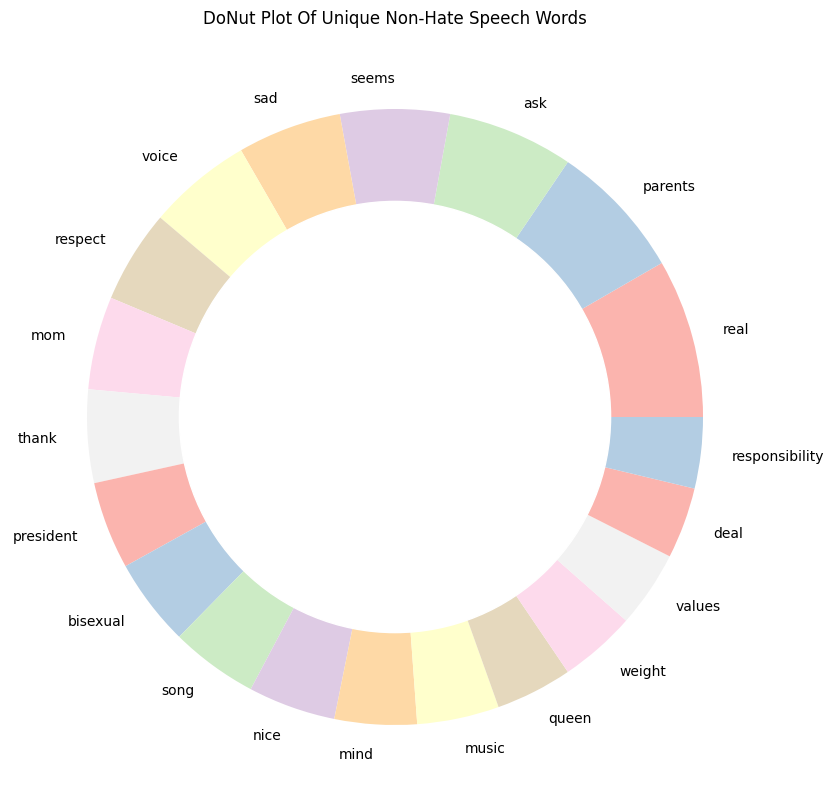

In [75]:
# For non-hate speech
visualizer.visualize_unique_words_donut(0, 20, colors=plt.cm.Pastel1.colors)

In [76]:
print("The top 20 unique words in Hate Speech are:")
unique_negative.style.background_gradient(cmap='Greens')

The top 20 unique words in Hate Speech are:


,words,count
0,niggers,25
1,whore,17
2,filthy,17
3,cunt,16
4,nigger,16
5,whites,14
6,religious,12
7,penis,12
8,killed.,12
9,anti,11


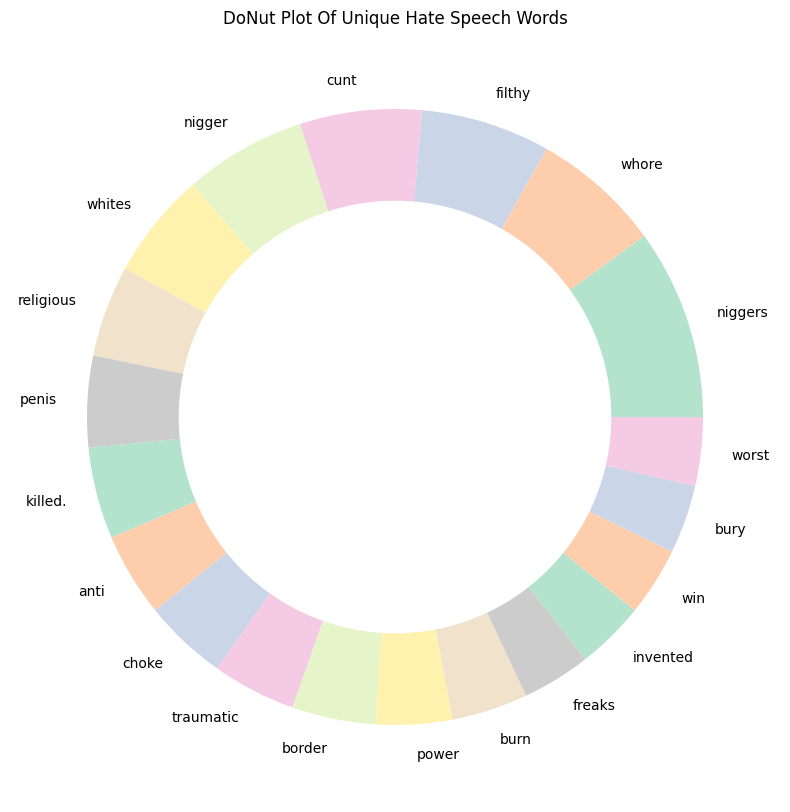

In [77]:
# For hate speech
visualizer.visualize_unique_words_donut(1, 20, colors=plt.cm.Pastel2.colors)

## Word count 

#### Non hate word cloud

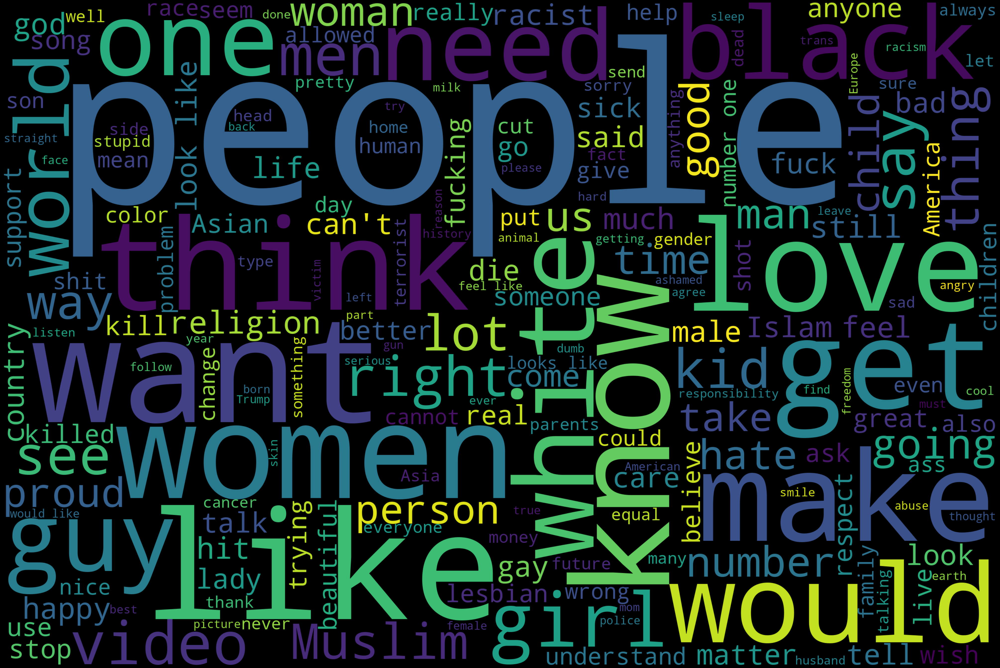

In [78]:
visualizer.generate_wordcloud_non_hate()

#### Hate word cloud

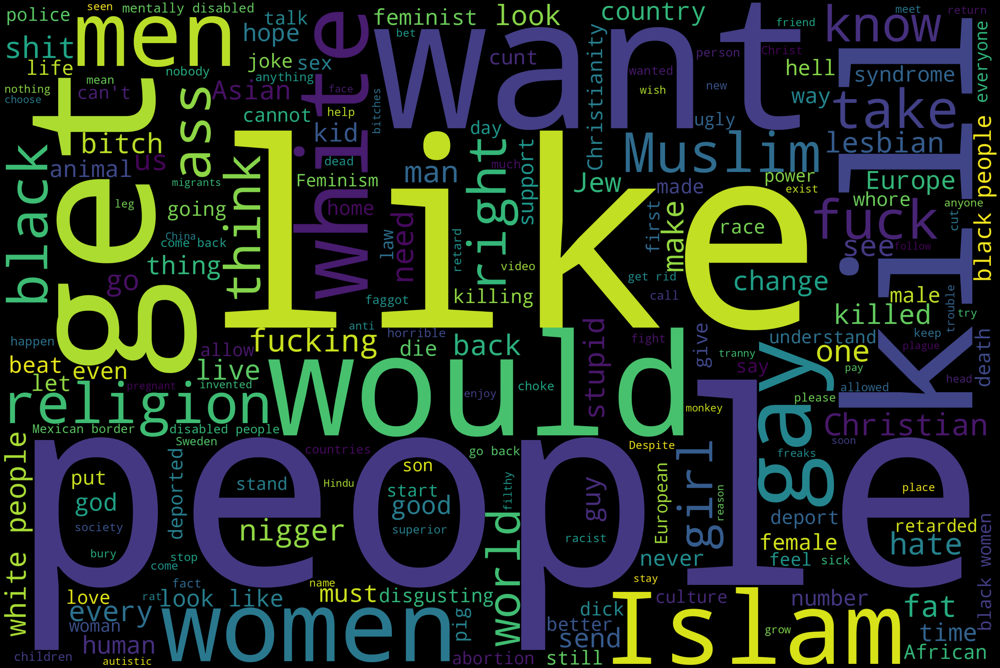

In [79]:
visualizer.generate_wordcloud_hate()

### Check distribution

In [80]:
visualizer.visualize_polarity_distribution()

In [81]:
visualizer.visualize_review_length_distribution()

In [82]:
visualizer.visualize_word_count_distribution()

In [83]:
df = df[['cleaned_comment', 'class']]

# 5. Data modeling

### First step : is to create embeddings from our comments so that these embeddings will be later passed to different models 

## We'll start with bert embeddings

In [5]:
df = pd.read_csv('./Data/pegasus_data.csv')
df = df[['cleaned_comment', 'class']]

In [6]:
traindata,testdata=train_test_split(df,test_size=0.2,random_state=42)
print('Data shapes :',traindata.shape,testdata.shape)

Data shapes : (2948, 2) (738, 2)


In [86]:
train_comments = traindata['cleaned_comment'].values.tolist()
train_labels = traindata['class'].values.tolist()
test_comments = testdata['cleaned_comment'].values.tolist()
test_labels = testdata['class'].values.tolist()

train_comments, val_comments, train_labels, val_labels = train_test_split(train_comments, train_labels,
                                                                            test_size=0.1,random_state=42,stratify=train_labels)

In [87]:
print('Comments len :')
print('----')
print('train_comments',len(train_comments))
print('test_comments',len(test_comments))
print('valid_comments',len(val_comments))
print('----')

Comments len :
----
train_comments 2653
test_comments 738
valid_comments 295
----


### Generate bert embedding

In [88]:
# Instance of bert embeddings
BertEmbed=BertEmbedding(train_comments, test_comments, val_comments)

In [89]:
tokenizer, train_embeddings, val_embeddings, test_embeddings =  BertEmbed.generate_bert_embeddings()

In [90]:
#Create train dataframe
dfinter = []
for emb, label in zip(train_embeddings, train_labels):
    dfinter.append({'comment_embedding': emb, 'label': label})
traindata = pd.DataFrame(dfinter)
print(traindata.shape)
traindata.head(4)

(2653, 2)


,comment_embedding,label
0,"[0.22550988, 0.39024884, 0.4869176, 0.3586974,...",1
1,"[-0.06585185, -0.060144704, 0.05662379, 0.0625...",0
2,"[-0.122529626, 0.40650278, -0.27360538, -0.212...",1
3,"[0.10199389, 0.078111894, 0.20343138, -0.33077...",0


In [91]:
#Create test dataframe
dfinter = []
for emb, label in zip(test_embeddings, test_labels):
    dfinter.append({'comment_embedding': emb, 'label': label})
testdata = pd.DataFrame(dfinter)
print(testdata.shape)
testdata.head(4)

(738, 2)


,comment_embedding,label
0,"[0.22439966, 0.36096308, 0.09895055, 0.1442883...",0
1,"[0.2107291, 0.05618518, 0.19700702, -0.1029363...",0
2,"[-0.077766, -0.10448319, -0.53871477, -0.37174...",0
3,"[-0.0023392928, 0.5973695, -0.39766195, -0.128...",0


In [92]:
#Create val dataframe
dfinter = []
for emb, label in zip(val_embeddings, val_labels):
    dfinter.append({'comment_embedding': emb, 'label': label})
valdata = pd.DataFrame(dfinter)
print(valdata.shape)
valdata.head(4)

(295, 2)


,comment_embedding,label
0,"[0.032151792, 0.72225183, -0.6718182, -0.17263...",1
1,"[-0.9118341, -0.15891144, -0.6649435, -0.19420...",0
2,"[-0.19986604, 0.6030543, -0.5454061, -0.282015...",1
3,"[0.25395834, -0.2439524, -0.31541064, 0.040028...",0


In [ ]:
traindata.to_csv('./Data/traindata_bert.csv', index=False)
testdata.to_csv('./Data/testdata_bert.csv', index=False)
valdata.to_csv('./Data/valdata_bert.csv', index=False)


### Now after generating the embeddings we're going to use them for modeling

#### CNN

In [93]:
#Get data
train_data, val_data, test_data = load_data(traindata, valdata, testdata)

cnn_model = CNN(768,2)

# training the model
trainer = Model_training(cnn_model, train_data, val_data,epochs=20)
train_losses, val_losses, train_accuracies, val_accuracies = trainer.train()

Epoch [20/20], Train Loss: 0.1452, Val Loss: 0.2703, Train Acc: 0.9427, Val Acc: 0.8814


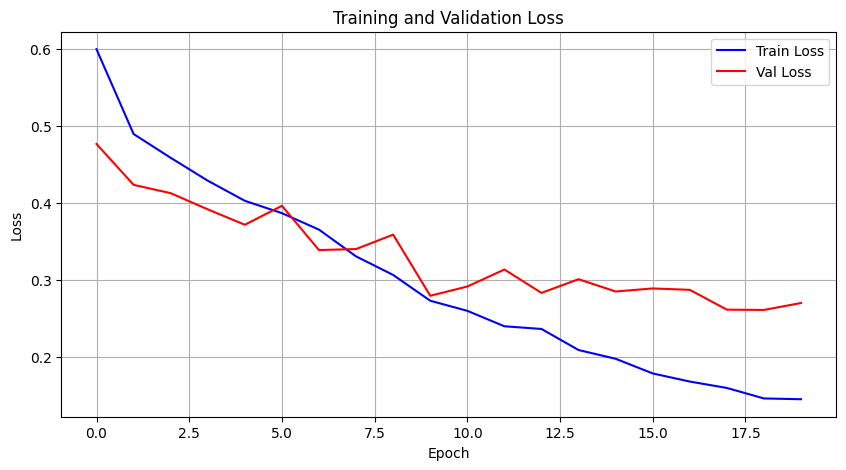

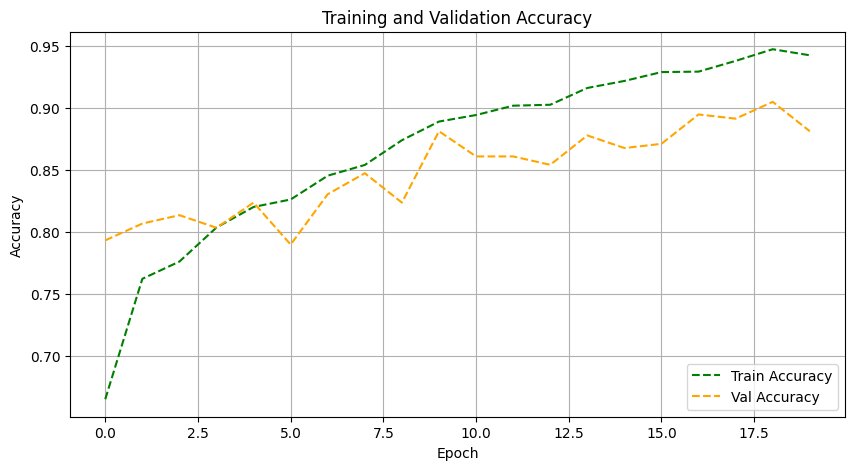

In [94]:
plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)

### Training and Validation Metrics Summary

#### Loss
- **Training loss** steadily decreases, indicating learning.
- **Validation loss** decreases overall but fluctuates after epoch 8–10.
- Slight overfitting may start around epoch 10.

#### Accuracy
- **Training accuracy** rises consistently to ~94%.
- **Validation accuracy** also improves, peaking around 90%, with minor drops.
- Small gap between training and validation accuracy suggests mild overfitting.

#### Conclusion
The model performs well with strong generalization. Overfitting is limited but could be reduced with early stopping or regularization.


Accuracy 0.8509, Precision: 0.8442, Recall: 0.8512, F1-score: 0.8469

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.85      0.87       440
           1       0.79      0.85      0.82       298

    accuracy                           0.85       738
   macro avg       0.84      0.85      0.85       738
weighted avg       0.85      0.85      0.85       738



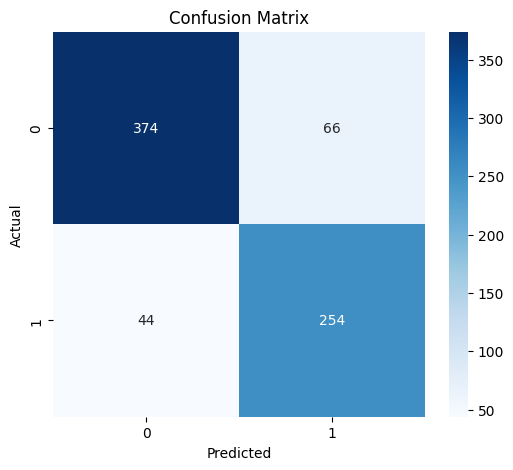

In [95]:
# Model evaluation
evaluate_cnn_model(cnn_model, test_data)


### Evaluation Summary

#### Confusion Matrix
- True Positives (1 predicted as 1): 254
- True Negatives (0 predicted as 0): 374
- False Positives (0 predicted as 1): 66
- False Negatives (1 predicted as 0): 44

#### Classification Report
- **Accuracy**: 85.09%
- **Precision**: 84.42%
- **Recall**: 85.12%
- **F1-score**: 84.69%

#### Class-wise Performance
- **Class 0**: Precision 0.89, Recall 0.85, F1-score 0.87
- **Class 1**: Precision 0.79, Recall 0.85, F1-score 0.82

#### Conclusion
The model performs well overall, with slightly better performance on class 0. Precision for class 1 could be improved.


#### LSTM

In [96]:
lstm_classifier = LSTMClassifier(tokenizer)

In [97]:
history = lstm_classifier.train_model(
    traindata,  
    testdata,   
    epochs=40,
    batch_size=32
)

Epoch 1/40
83/83 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - Precision: 0.4472 - Recall: 0.5620 - accuracy: 0.5593 - loss: 0.8055 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.5962 - val_loss: 0.6647 - learning_rate: 1.0000e-04
Epoch 2/40
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - Precision: 0.6204 - Recall: 0.7159 - accuracy: 0.7168 - loss: 0.5705 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.5962 - val_loss: 0.6476 - learning_rate: 1.0000e-04
Epoch 3/40
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - Precision: 0.6869 - Recall: 0.7875 - accuracy: 0.7813 - loss: 0.4839 - val_Precision: 1.0000 - val_Recall: 0.0101 - val_accuracy: 0.6003 - val_loss: 0.6181 - learning_rate: 1.0000e-04
Epoch 4/40
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - Precision: 0.7045 - Recall: 0.7703 - accuracy: 0.7858 - loss: 0.4630 - val_Precision: 0.9455 - val_Recall: 0.1745 - val_accuracy: 0.6626 - val_loss: 0.5704 - learning_rate: 1.0000e-04
Epoch 5/40
83/83 ━━━━━━━━━━━━━━━━━━━

24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step
Accuracy: 0.8875, Precision: 0.8915, Recall: 0.8743, F1-score: 0.8808

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.94      0.91       440
           1       0.91      0.81      0.85       298

    accuracy                           0.89       738
   macro avg       0.89      0.87      0.88       738
weighted avg       0.89      0.89      0.89       738



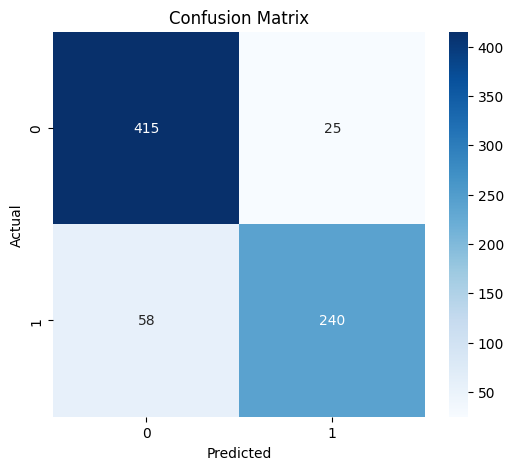

In [98]:
# Evaluate
lstm_classifier.evaluate_model(testdata)

### Evaluation Summary

#### Confusion Matrix
- True Positives (1 predicted as 1): 240  
- True Negatives (0 predicted as 0): 415  
- False Positives (0 predicted as 1): 25  
- False Negatives (1 predicted as 0): 58  

#### Classification Report
- **Accuracy**: 88.75%  
- **Precision**: 89.15%  
- **Recall**: 87.43%  
- **F1-score**: 88.08%  

#### Class-wise Performance
- **Class 0**: Precision 0.88, Recall 0.94, F1-score 0.91  
- **Class 1**: Precision 0.91, Recall 0.81, F1-score 0.85  

#### Conclusion
This model shows strong overall performance, especially in correctly identifying class 0. Class 1 has high precision but could benefit from improved recall.


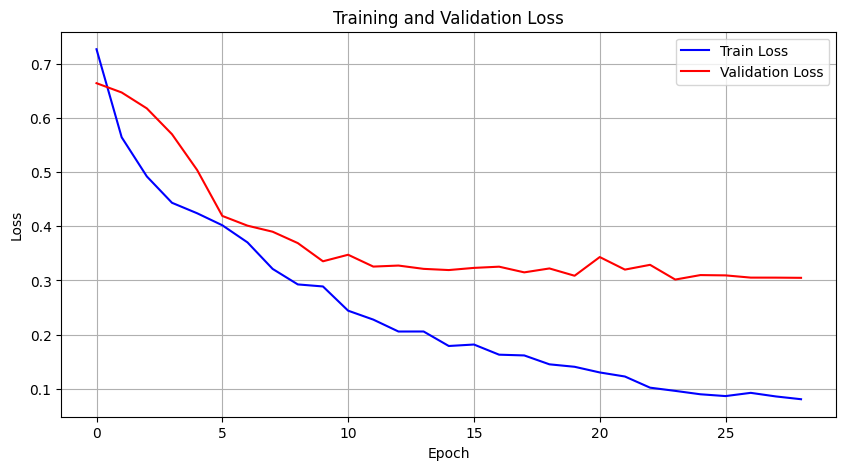

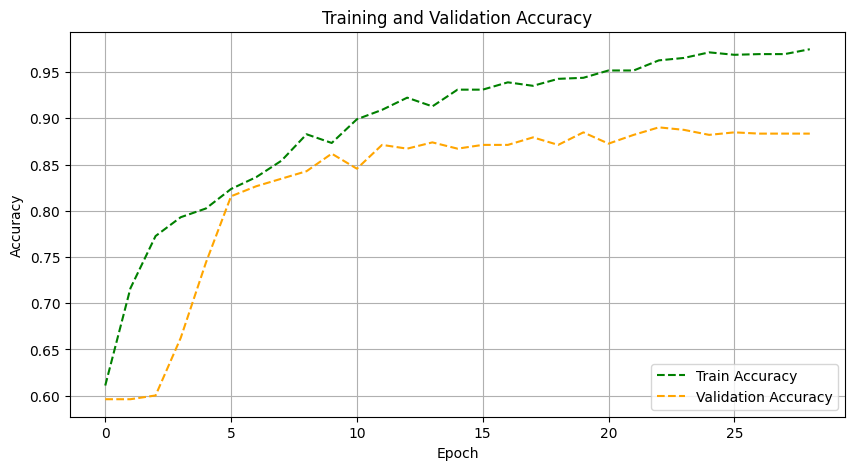

In [99]:
# Plot metrics
lstm_classifier.plot_metrics(history)


### Training Summary

#### Loss
- **Training loss** steadily decreases to below 0.1.
- **Validation loss** drops until around epoch 6, then plateaus around 0.3.
- The gap between training and validation loss increases, suggesting mild overfitting after epoch 10.

#### Accuracy
- **Training accuracy** increases consistently to above 97%.
- **Validation accuracy** improves quickly and stabilizes around 88–89%.
- The widening gap between training and validation accuracy confirms slight overfitting.

#### Conclusion
The model learns well and generalizes reasonably, but regularization or early stopping could help reduce overfitting.


### SVM

In [100]:
X_train = np.array(traindata['comment_embedding'].tolist())
y_train = np.array(traindata['label'])

X_val = np.array(valdata['comment_embedding'].tolist())
y_val = np.array(valdata['label'])

X_test = np.array(testdata['comment_embedding'].tolist())
y_test = np.array(testdata['label'])

In [101]:
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [102]:
# Instantiation of the SVMClassifier object.
svm_model = SVMClassifier(kernel='linear')

In [103]:
# Train SVM model
svm_model.train_model(X_train_resampled,y_train_resampled)

# Predict on test set
y_pred = svm_model.predict_data(X_test)


In [104]:
# Check the performance after training.
train_accuracy = svm_model.model.score(X_train_resampled, y_train_resampled)
val_accuracy = svm_model.model.score(X_val, y_val)

print(f"Train Accuracy: {train_accuracy:.4f}")
print(f"Validation Accuracy: {val_accuracy:.4f}")


Train Accuracy: 0.9565
Validation Accuracy: 0.8102


Accuracy: 0.8117, Precision: 0.8040, Recall: 0.8074, F1-score: 0.8055

Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.83      0.84       440
           1       0.76      0.79      0.77       298

    accuracy                           0.81       738
   macro avg       0.80      0.81      0.81       738
weighted avg       0.81      0.81      0.81       738



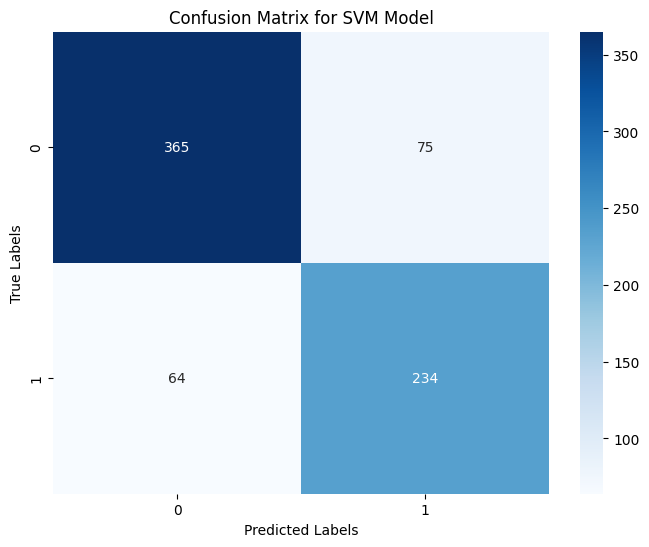

In [105]:
svm_model.evaluate_svm_model(X_test, y_test)

### Evaluation Summary – SVM Model

#### Confusion Matrix
- True Positives (1 predicted as 1): 234  
- True Negatives (0 predicted as 0): 365  
- False Positives (0 predicted as 1): 75  
- False Negatives (1 predicted as 0): 64  

#### Classification Report
- **Accuracy**: 81.17%  
- **Precision**: 80.40%  
- **Recall**: 80.74%  
- **F1-score**: 80.55%  

#### Class-wise Performance
- **Class 0**: Precision 0.85, Recall 0.83, F1-score 0.84  
- **Class 1**: Precision 0.76, Recall 0.79, F1-score 0.77  

#### Conclusion
The model performs reasonably well, with better precision on class 0. Class 1 has slightly lower metrics, indicating room for improvement in handling that class.


### KNN

In [106]:
knn_classifier = KNNClassifier()

In [107]:
# Train KNN model
knn_classifier.train_model(X_train_resampled,y_train_resampled)


Accuracy: 0.8699, Precision: 0.8686, Recall: 0.8595, F1-score: 0.8633

Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.91      0.89       440
           1       0.86      0.81      0.83       298

    accuracy                           0.87       738
   macro avg       0.87      0.86      0.86       738
weighted avg       0.87      0.87      0.87       738



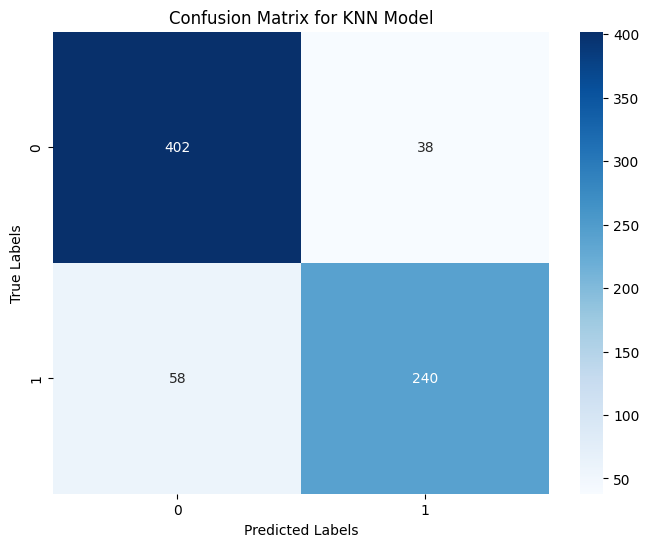

In [108]:
knn_classifier.evaluate_knn_model(X_test, y_test)

### Evaluation Summary – KNN Model

#### Confusion Matrix
- True Positives (1 predicted as 1): 240  
- True Negatives (0 predicted as 0): 402  
- False Positives (0 predicted as 1): 38  
- False Negatives (1 predicted as 0): 58  

#### Classification Report
- **Accuracy**: 86.99%  
- **Precision**: 86.86%  
- **Recall**: 85.95%  
- **F1-score**: 86.33%  

#### Class-wise Performance
- **Class 0**: Precision 0.87, Recall 0.91, F1-score 0.89  
- **Class 1**: Precision 0.86, Recall 0.81, F1-score 0.83  

#### Conclusion
This KNN model performs well overall, with balanced precision and recall across both classes. Class 1 recall could be improved slightly to reduce false negatives.


### Xgboost

Accuracy: 0.8388, Precision: 0.8333, Recall: 0.8307, F1-score: 0.8319

Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.87      0.87       440
           1       0.81      0.79      0.80       298

    accuracy                           0.84       738
   macro avg       0.83      0.83      0.83       738
weighted avg       0.84      0.84      0.84       738



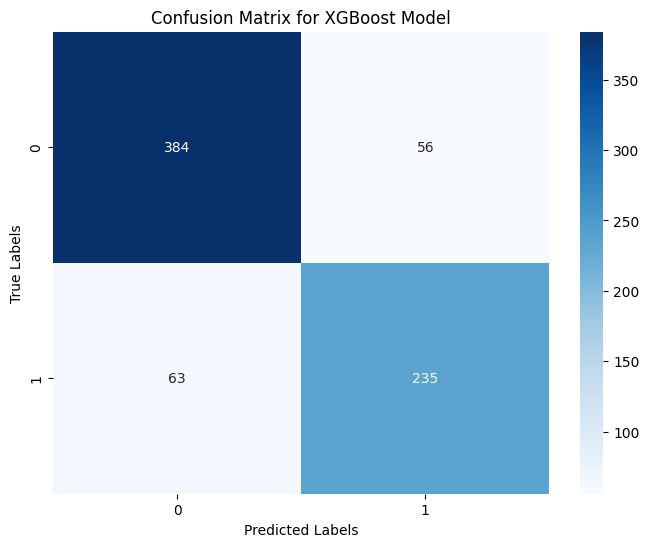

In [109]:
# Create an instance of the XGBoost classifier with default hyperparameters
xgboost_classifier = XGBoostClassifier(learning_rate=0.05, n_estimators=200, max_depth=5)

# Train the model
xgboost_classifier.train_model(X_train_resampled, y_train_resampled)

# Evaluate the model
xgboost_classifier.evaluate_xgboost_model(X_test, y_test)


### Evaluation Summary – XGBoost Model

#### Confusion Matrix
- True Positives (1 predicted as 1): 235  
- True Negatives (0 predicted as 0): 384  
- False Positives (0 predicted as 1): 56  
- False Negatives (1 predicted as 0): 63  

#### Classification Report
- **Accuracy**: 83.88%  
- **Precision**: 83.33%  
- **Recall**: 83.07%  
- **F1-score**: 83.19%  

#### Class-wise Performance
- **Class 0**: Precision 0.86, Recall 0.87, F1-score 0.87  
- **Class 1**: Precision 0.81, Recall 0.79, F1-score 0.80  

#### Conclusion
The model performs well overall. Class 0 is predicted slightly better than class 1. There is a modest trade-off between precision and recall for class 1.



## Hard Voting

In [110]:
# Initialize the HardVotingClassifier with all five models
hard_voting_model = HardVotingClassifier(
    svm_model=svm_model,
    knn_model=knn_classifier,
    lstm_model=lstm_classifier,
    cnn_model=cnn_model,
    xgboost_model=xgboost_classifier
)

# Convert validation data to PyTorch tensor for CNN
val_inputs_tensor = torch.tensor(X_val, dtype=torch.float32)

# Perform predictions using the hard voting model
y_pred = hard_voting_model.predict(X_val, X_val, val_inputs_tensor)

# Evaluate the model performance (e.g., accuracy)
accuracy = accuracy_score(y_val, y_pred)
print(f'Accuracy of Hard Voting Classifier: {accuracy:.4f}')


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Accuracy of Hard Voting Classifier: 0.9254


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.95      0.94       182
           1       0.91      0.89      0.90       113

    accuracy                           0.93       295
   macro avg       0.92      0.92      0.92       295
weighted avg       0.93      0.93      0.93       295


Confusion Matrix:


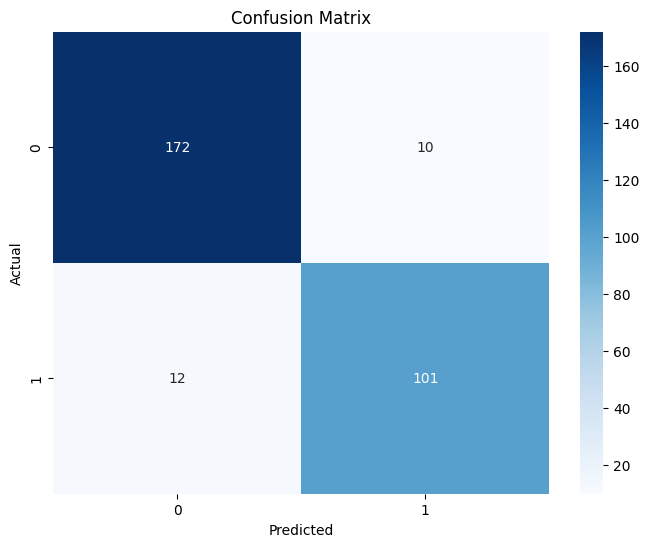

In [111]:
# Evaluate the model with the provided validation data
hard_voting_model.evaluate(X_val, X_val, val_inputs_tensor, y_val)

### Evaluation Summary – Hard Voting Classifier

#### Confusion Matrix
- True Positives (1 predicted as 1): 101  
- True Negatives (0 predicted as 0): 172  
- False Positives (0 predicted as 1): 10  
- False Negatives (1 predicted as 0): 12  

#### Classification Report
- **Accuracy**: 92.54%  
- **Precision**: 83.33%  
- **Recall**: 83.07%  
- **F1-score**: 83.19%  

#### Class-wise Performance
- **Class 0**: Precision 0.93, Recall 0.95, F1-score 0.94  
- **Class 1**: Precision 0.91, Recall 0.89, F1-score 0.90  

#### Conclusion
The model shows excellent balance and performance across both classes, with high accuracy and strong precision/recall values. It’s the best performer so far.


In [113]:
# List of models
models = ['hard_voting', 'svm', 'knn', 'lstm', 'cnn', 'xgboost']

# Model instances
the_models = {
    'hard_voting': hard_voting_model,
    'svm': svm_model,
    'knn': knn_classifier,
    'lstm': lstm_classifier,
    'cnn': cnn_model,
    'xgboost': xgboost_classifier
}

# Instantiate and evaluate

model_evaluator = ModelEvaluator(models, the_models, X_val, X_val, val_inputs_tensor, y_val)
model_evaluator.evaluate_models()
print('---Accuracy with bert---')
accuracy_df_bert = model_evaluator.display_results()


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
---Accuracy with bert---
         Model  Accuracy
0  hard_voting  0.925424
1          svm  0.810169
2          knn  0.864407
3         lstm  0.928814
4          cnn  0.881356
5      xgboost  0.884746


### Now we're going to use Deberta for embeddings

In [114]:
# Instance of bert deberta embeddings
DebertaEmbed=DebertaEmbedding(train_comments, test_comments, val_comments)

In [115]:
tokenizer, train_embeddings, val_embeddings, test_embeddings =  DebertaEmbed.generate_deberta_embeddings()

In [116]:
#Create train dataframe
dfinter = []
for emb, label in zip(train_embeddings, train_labels):
    dfinter.append({'comment_embedding': emb, 'label': label})
traindata = pd.DataFrame(dfinter)
print(traindata.shape)
traindata.head(4)

(2653, 2)


,comment_embedding,label
0,"[0.057025317, -0.035139453, -0.086753584, -0.0...",1
1,"[0.05713572, -0.04121634, -0.096727036, -0.047...",0
2,"[0.07127284, -0.036056582, -0.085357994, -0.02...",1
3,"[0.05598719, -0.031536303, -0.08330167, -0.036...",0


In [117]:
#Create test dataframe
dfinter = []
for emb, label in zip(test_embeddings, test_labels):
    dfinter.append({'comment_embedding': emb, 'label': label})
testdata = pd.DataFrame(dfinter)
print(testdata.shape)
testdata.head(4)

(738, 2)


,comment_embedding,label
0,"[0.06711297, -0.027603678, -0.07369609, -0.032...",0
1,"[0.069010794, -0.03568412, -0.089948766, -0.02...",0
2,"[0.065336116, -0.024178877, -0.09278985, -0.02...",0
3,"[0.058812793, -0.028473567, -0.08841404, -0.02...",0


In [118]:
#Create val dataframe
dfinter = []
for emb, label in zip(val_embeddings, val_labels):
    dfinter.append({'comment_embedding': emb, 'label': label})
valdata = pd.DataFrame(dfinter)
print(valdata.shape)
valdata.head(4)

(295, 2)


,comment_embedding,label
0,"[0.061430797, -0.043504562, -0.08283397, -0.03...",1
1,"[0.055142123, -0.03202818, -0.081878416, -0.03...",0
2,"[0.059202023, -0.034646597, -0.08298477, -0.02...",1
3,"[0.054631352, -0.033516224, -0.07662344, -0.02...",0


In [ ]:
traindata.to_csv('./Data/traindata_debertberta.csv', index=False)
testdata.to_csv('./Data/testdata_deberta.csv', index=False)
valdata.to_csv('./Data/valdata_bert.csv', index=False)


### CNN

In [119]:
#Get data
train_data, val_data, test_data = load_data(traindata, valdata, testdata)

cnn_model = CNN(768,2)

# Entraînement du modèle
trainer = Model_training(cnn_model, train_data, val_data,epochs=20)
train_losses, val_losses, train_accuracies, val_accuracies = trainer.train()

Epoch [20/20], Train Loss: 0.5643, Val Loss: 0.5319, Train Acc: 0.7015, Val Acc: 0.7424


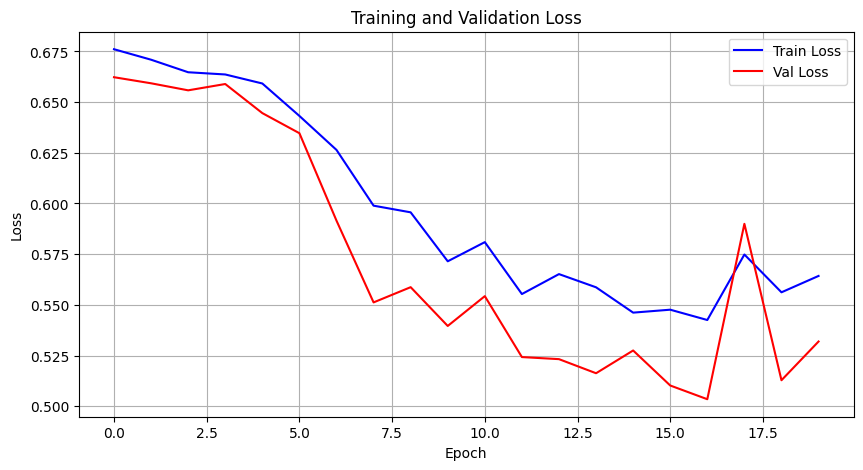

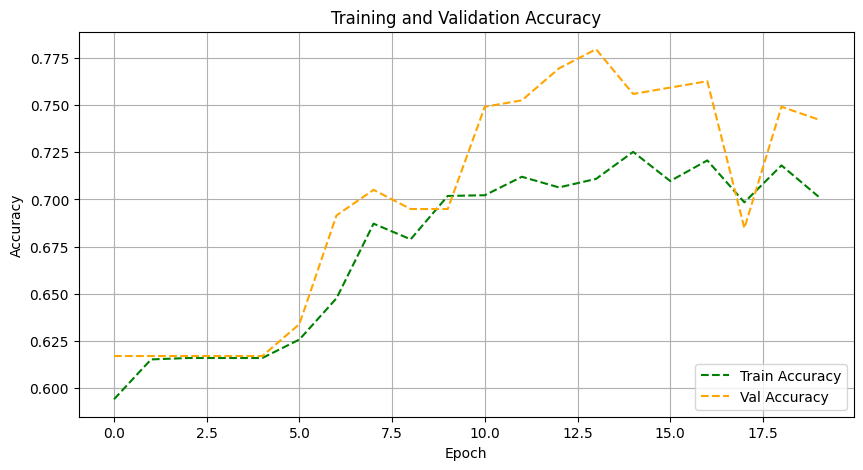

In [120]:
plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)

### Training Summary

#### Loss
- **Training loss** gradually decreases but fluctuates slightly after epoch 10.
- **Validation loss** drops steadily and remains slightly lower than training loss toward the end.
- Loss patterns suggest consistent learning with no major overfitting.

#### Accuracy
- **Training accuracy** improves slowly, reaching around 71%.
- **Validation accuracy** increases faster, peaking near 78%.
- Validation accuracy consistently remains above training accuracy, indicating good generalization.

#### Conclusion
The model shows stable training with strong validation performance. It generalizes well and could benefit from further fine-tuning for training accuracy.


Accuracy 0.7046, Precision: 0.7054, Recall: 0.7133, F1-score: 0.7021

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.67      0.73       440
           1       0.61      0.76      0.67       298

    accuracy                           0.70       738
   macro avg       0.71      0.71      0.70       738
weighted avg       0.72      0.70      0.71       738



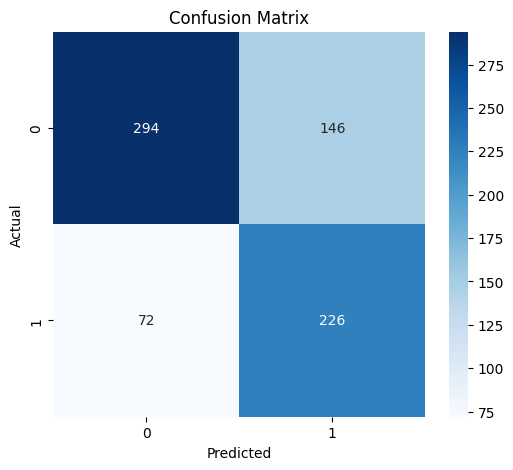

In [121]:
# Evaluation
evaluate_cnn_model(cnn_model, test_data)


### Evaluation Summary

#### Confusion Matrix
- True Positives (1 predicted as 1): 226  
- True Negatives (0 predicted as 0): 294  
- False Positives (0 predicted as 1): 146  
- False Negatives (1 predicted as 0): 72  

#### Classification Report
- **Accuracy**: 70.46%  
- **Precision**: 70.54%  
- **Recall**: 71.33%  
- **F1-score**: 70.21%  

#### Class-wise Performance
- **Class 0**: Precision 0.80, Recall 0.67, F1-score 0.73  
- **Class 1**: Precision 0.61, Recall 0.76, F1-score 0.67  

#### Conclusion
The model has moderate performance. It handles class 1 recall fairly well but struggles with class 0 precision, suggesting class imbalance or boundary confusion.


### LSTM

In [122]:
lstm_classifier = LSTMClassifier(tokenizer)

In [123]:
history = lstm_classifier.train_model(
    traindata,  
    testdata,   
    epochs=40,
    batch_size=32
)

Epoch 1/40
83/83 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - Precision: 0.4697 - Recall: 0.6069 - accuracy: 0.5906 - loss: 0.7941 - val_Precision: 0.4038 - val_Recall: 1.0000 - val_accuracy: 0.4038 - val_loss: 0.7891 - learning_rate: 1.0000e-04
Epoch 2/40
83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - Precision: 0.5663 - Recall: 0.7333 - accuracy: 0.6875 - loss: 0.6102 - val_Precision: 0.4038 - val_Recall: 1.0000 - val_accuracy: 0.4038 - val_loss: 0.7994 - learning_rate: 1.0000e-04
Epoch 3/40
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - Precision: 0.6226 - Recall: 0.7460 - accuracy: 0.7242 - loss: 0.5388 - val_Precision: 0.4038 - val_Recall: 1.0000 - val_accuracy: 0.4038 - val_loss: 0.7825 - learning_rate: 1.0000e-04
Epoch 4/40
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - Precision: 0.6603 - Recall: 0.7107 - accuracy: 0.7350 - loss: 0.5472 - val_Precision: 0.4038 - val_Recall: 1.0000 - val_accuracy: 0.4038 - val_loss: 0.7494 - learning_rate: 1.0000e-04
Epoch 5/40
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step 

24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
Accuracy: 0.8130, Precision: 0.8087, Recall: 0.7993, F1-score: 0.8030

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.87      0.85       440
           1       0.79      0.73      0.76       298

    accuracy                           0.81       738
   macro avg       0.81      0.80      0.80       738
weighted avg       0.81      0.81      0.81       738



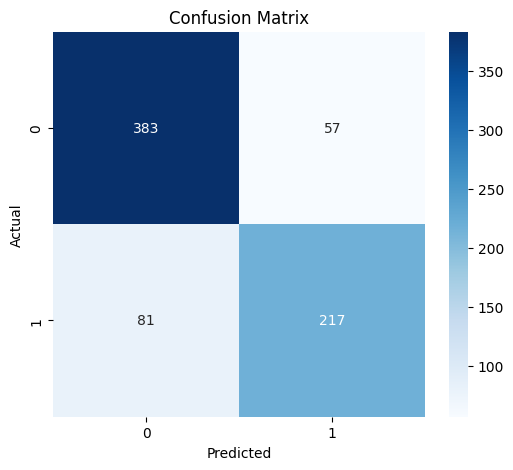

In [124]:
# Evaluate
lstm_classifier.evaluate_model(testdata)

### Evaluation Summary – LSTM Classifier

#### Confusion Matrix
- True Positives (1 predicted as 1): 217  
- True Negatives (0 predicted as 0): 383  
- False Positives (0 predicted as 1): 57  
- False Negatives (1 predicted as 0): 81  

#### Classification Report
- **Accuracy**: 81.30%  
- **Precision**: 80.87%  
- **Recall**: 79.93%  
- **F1-score**: 80.30%  

#### Class-wise Performance
- **Class 0**: Precision 0.83, Recall 0.87, F1-score 0.85  
- **Class 1**: Precision 0.79, Recall 0.73, F1-score 0.76  

#### Conclusion
The LSTM model performs well with high accuracy and strong metrics for class 0. There's room for improvement in recall for class 1 to reduce false negatives.


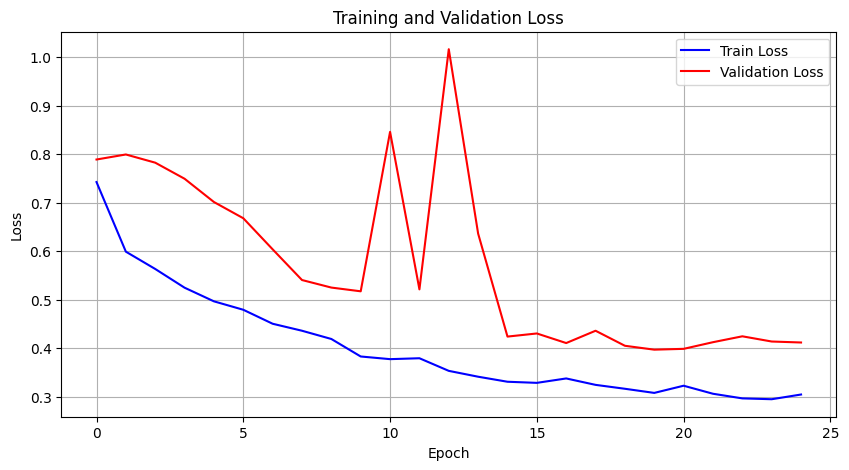

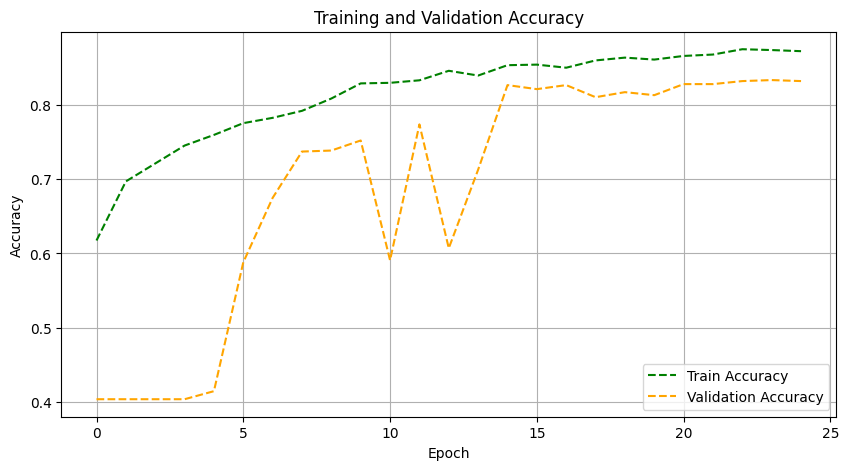

In [125]:
# Plot metrics
lstm_classifier.plot_metrics(history)

### Training Summary

#### Loss
- **Training loss** steadily decreases, indicating consistent learning.
- **Validation loss** is unstable with several spikes, especially around epochs 10–13, suggesting potential issues like noisy validation data or batch variance.
- After epoch 14, validation loss stabilizes around 0.42.

#### Accuracy
- **Training accuracy** improves smoothly, reaching above 86%.
- **Validation accuracy** shows fluctuations early on, then improves and stabilizes around 83–84%.
- The final gap between training and validation accuracy is small, showing decent generalization.

#### Conclusion
Despite early instability, the model converges well. Consider smoothing techniques, more stable validation data, or early stopping to avoid erratic spikes.


### SVM

In [126]:
X_train = np.array(traindata['comment_embedding'].tolist())
y_train = np.array(traindata['label'])

X_val = np.array(valdata['comment_embedding'].tolist())
y_val = np.array(valdata['label'])

X_test = np.array(testdata['comment_embedding'].tolist())
y_test = np.array(testdata['label'])

In [127]:
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [142]:
# Instantiation of the SVMClassifier object
svm_model = SVMClassifier(kernel='linear')

In [177]:
# Train SVM model
svm_model.train_model(X_train_resampled,y_train_resampled)

# Predict on test set
y_pred = svm_model.predict_data(X_test)


In [178]:
# Check performance after training
train_accuracy = svm_model.model.score(X_train_resampled, y_train_resampled)
val_accuracy = svm_model.model.score(X_val, y_val)

print(f"Train Accuracy: {train_accuracy:.4f}")
print(f"Validation Accuracy: {val_accuracy:.4f}")


Train Accuracy: 0.7589
Validation Accuracy: 0.7559


Accuracy: 0.7046, Precision: 0.7006, Recall: 0.7079, F1-score: 0.7003

Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.69      0.74       440
           1       0.61      0.72      0.66       298

    accuracy                           0.70       738
   macro avg       0.70      0.71      0.70       738
weighted avg       0.72      0.70      0.71       738



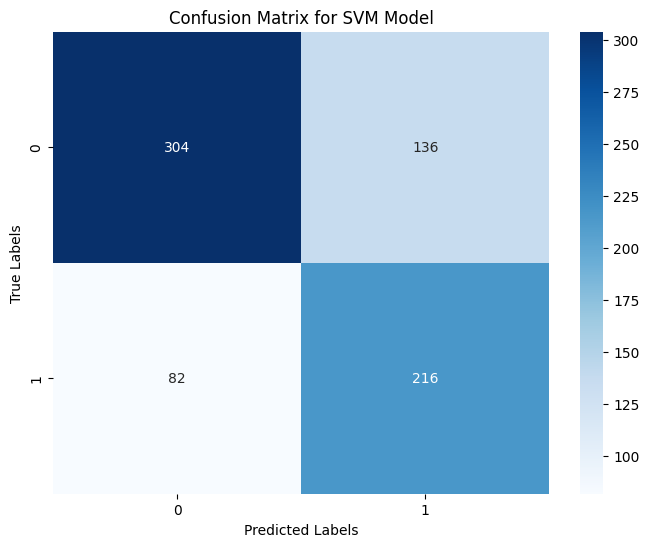

In [131]:
svm_model.evaluate_svm_model(X_test, y_test)

### Evaluation Summary – SVM Model

#### Confusion Matrix
- True Positives (1 predicted as 1): 216  
- True Negatives (0 predicted as 0): 304  
- False Positives (0 predicted as 1): 136  
- False Negatives (1 predicted as 0): 82  

#### Classification Report
- **Accuracy**: 70.46%  
- **Precision**: 70.06%  
- **Recall**: 70.79%  
- **F1-score**: 70.03%  

#### Class-wise Performance
- **Class 0**: Precision 0.79, Recall 0.69, F1-score 0.74  
- **Class 1**: Precision 0.61, Recall 0.72, F1-score 0.66  

#### Conclusion
This SVM model has moderate performance. It performs better on class 0 (higher precision), while class 1 is predicted with lower confidence and recall. Improvements can be made in reducing false positives for class 0 and false negatives for class 1.


### KNN 

In [172]:
knn_classifier = KNNClassifier(n_neighbors=3)

In [173]:
# Train KNN model
knn_classifier.train_model(X_train_resampled,y_train_resampled)


Accuracy: 0.7967, Precision: 0.7891, Recall: 0.7879, F1-score: 0.7885

Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.83      0.83       440
           1       0.75      0.74      0.75       298

    accuracy                           0.80       738
   macro avg       0.79      0.79      0.79       738
weighted avg       0.80      0.80      0.80       738



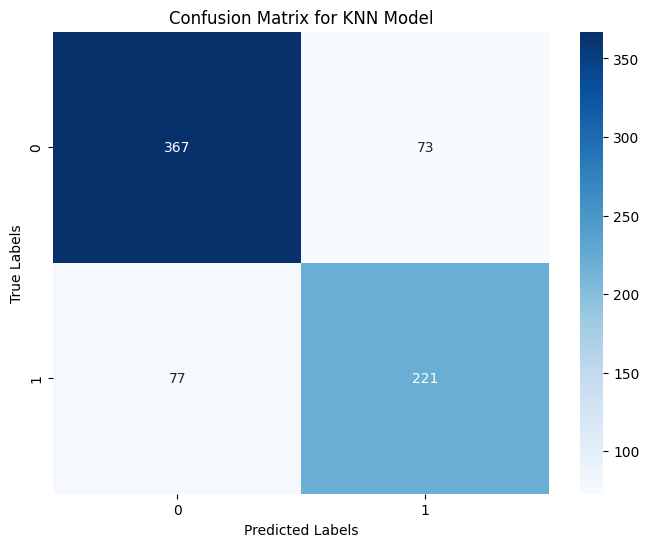

In [174]:
knn_classifier.evaluate_knn_model(X_test, y_test)

### Xgboost

Accuracy: 0.8252, Precision: 0.8179, Recall: 0.8220, F1-score: 0.8197

Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.84      0.85       440
           1       0.77      0.81      0.79       298

    accuracy                           0.83       738
   macro avg       0.82      0.82      0.82       738
weighted avg       0.83      0.83      0.83       738



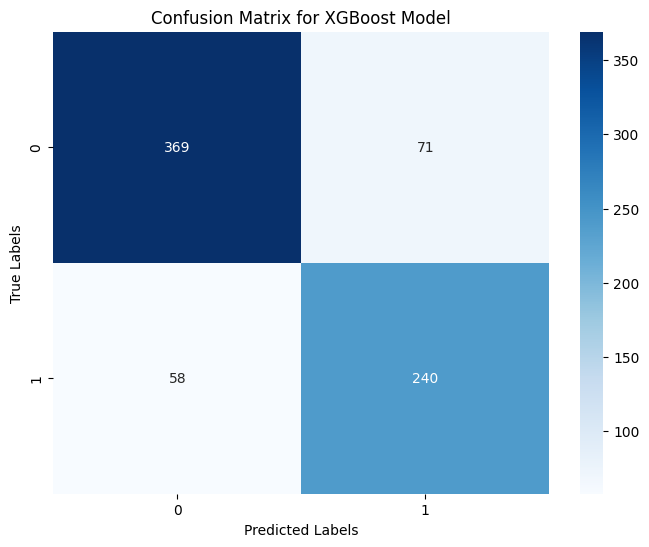

In [167]:
# Create an instance of the XGBoost classifier with default hyperparameters
xgboost_classifier = XGBoostClassifier(learning_rate=0.05, n_estimators=200, max_depth=5)

# Train the model
xgboost_classifier.train_model(X_train_resampled, y_train_resampled)

# Evaluate the model
xgboost_classifier.evaluate_xgboost_model(X_test, y_test)


### Evaluation Summary – XGBoost Model

#### Confusion Matrix
- True Positives (1 predicted as 1): 240  
- True Negatives (0 predicted as 0): 369  
- False Positives (0 predicted as 1): 71  
- False Negatives (1 predicted as 0): 58  

#### Classification Report
- **Accuracy**: 82.52%  
- **Precision**: 81.79%  
- **Recall**: 82.20%  
- **F1-score**: 81.97%  

#### Class-wise Performance
- **Class 0**: Precision 0.86, Recall 0.84, F1-score 0.85  
- **Class 1**: Precision 0.77, Recall 0.81, F1-score 0.79  

#### Conclusion
The model performs well overall, with a solid balance between both classes. Class 0 slightly outperforms class 1, but both are handled effectively.


### Hard Voting

In [179]:
# Initialize the HardVotingClassifier with all five models
hard_voting_model = HardVotingClassifier(
    svm_model=svm_model,
    knn_model=knn_classifier,
    lstm_model=lstm_classifier,
    cnn_model=cnn_model,
    xgboost_model=xgboost_classifier
)

# Convert validation data to PyTorch tensor for CNN
val_inputs_tensor = torch.tensor(X_val, dtype=torch.float32)

# Perform predictions using the hard voting model
y_pred = hard_voting_model.predict(X_val, X_val, val_inputs_tensor)

# Evaluate the model performance (e.g., accuracy)
accuracy = accuracy_score(y_val, y_pred)
print(f'Accuracy of Hard Voting Classifier: {accuracy:.4f}')


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Accuracy of Hard Voting Classifier: 0.8271


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.84      0.86       182
           1       0.75      0.81      0.78       113

    accuracy                           0.83       295
   macro avg       0.82      0.82      0.82       295
weighted avg       0.83      0.83      0.83       295


Confusion Matrix:


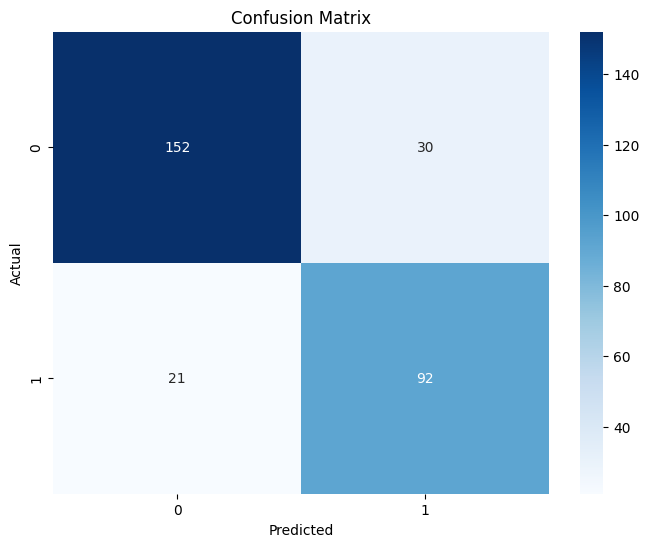

In [169]:
# Evaluate the model with the provided validation data
hard_voting_model.evaluate(X_val, X_val, val_inputs_tensor, y_val)

### Evaluation Summary – Hard Voting Classifier

#### Confusion Matrix
- True Positives (1 predicted as 1): 92  
- True Negatives (0 predicted as 0): 152  
- False Positives (0 predicted as 1): 30  
- False Negatives (1 predicted as 0): 21  

#### Classification Report
- **Accuracy**: 83%  
- **Precision**:  
  - Class 0: 0.88  
  - Class 1: 0.75  
- **Recall**:  
  - Class 0: 0.84  
  - Class 1: 0.81  
- **F1-score**:  
  - Class 0: 0.86  
  - Class 1: 0.78  

#### Conclusion
The model performs strongly across both classes, with slightly better results on class 0. Class 1 recall is solid, making this a reliable balanced model.


In [138]:
# List of models
models = ['hard_voting', 'svm', 'knn', 'lstm', 'cnn', 'xgboost']

# Model instances
the_models = {
    'hard_voting': hard_voting_model,
    'svm': svm_model,
    'knn': knn_classifier,
    'lstm': lstm_classifier,
    'cnn': cnn_model,
    'xgboost': xgboost_classifier
}

# Instantiate and evaluate

model_evaluator = ModelEvaluator(models, the_models, X_val, X_val, val_inputs_tensor, y_val)
model_evaluator.evaluate_models()
print('---Accuracy with deberta ---')
accuracy_df_deberta = model_evaluator.display_results()


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
---Accuracy with deberta---
         Model  Accuracy
0  hard_voting  0.820339
1          svm  0.755932
2          knn  0.698305
3         lstm  0.861017
4          cnn  0.742373
5      xgboost  0.840678


### Model Accuracy Comparison (with DeBERTa)

| Model        | Accuracy  |
|--------------|-----------|
| LSTM         | 0.8610    |
| XGBoost      | 0.8407    |
| Hard Voting  | 0.8203    |
| SVM          | 0.7559    |
| CNN          | 0.7424    |
| KNN          | 0.6983    |

#### Conclusion
- **LSTM** achieves the highest accuracy (86.10%), performing best overall.
- **XGBoost** and **Hard Voting** also show strong performance above 82%.
- **KNN** lags behind with the lowest accuracy (69.83%), suggesting it's less suitable for this setup.


### Now we're going to use Roberta for embeddings

In [180]:
# Instance of roberta embeddings
RobertaEmbed=RobertaEmbedding(train_comments, test_comments, val_comments)

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [181]:
tokenizer, train_embeddings, val_embeddings, test_embeddings =  RobertaEmbed.generate_roberta_embeddings()

In [182]:
#Create train dataframe
dfinter = []
for emb, label in zip(train_embeddings, train_labels):
    dfinter.append({'comment_embedding': emb, 'label': label})
traindata = pd.DataFrame(dfinter)
print(traindata.shape)
traindata.head(4)

(2653, 2)


,comment_embedding,label
0,"[-0.045604423, 0.0820765, -0.018952738, -0.129...",1
1,"[-0.12793247, 0.12414214, -0.009042662, -0.119...",0
2,"[-0.09087445, 0.09581774, -0.0041828174, -0.15...",1
3,"[-0.07303871, 0.13169442, -0.001150215, -0.122...",0


In [183]:
#Create test dataframe
dfinter = []
for emb, label in zip(test_embeddings, test_labels):
    dfinter.append({'comment_embedding': emb, 'label': label})
testdata = pd.DataFrame(dfinter)
print(testdata.shape)
testdata.head(4)

(738, 2)


,comment_embedding,label
0,"[-0.056241676, 0.14827228, -0.019222952, -0.12...",0
1,"[-0.10649897, 0.08658421, 0.023250723, -0.1125...",0
2,"[-0.09445165, 0.11632615, 0.016059132, -0.1072...",0
3,"[-0.10110071, 0.13555348, 0.001145687, -0.1509...",0


In [184]:
#Create val dataframe
dfinter = []
for emb, label in zip(val_embeddings, val_labels):
    dfinter.append({'comment_embedding': emb, 'label': label})
valdata = pd.DataFrame(dfinter)
print(valdata.shape)
valdata.head(4)

(295, 2)


,comment_embedding,label
0,"[-0.057961047, 0.11114329, 0.013681255, -0.112...",1
1,"[-0.14637572, 0.1221676, -0.0054292157, -0.133...",0
2,"[-0.07113166, 0.0963389, -0.0033682026, -0.117...",1
3,"[-0.10809748, 0.10558228, -0.04522612, -0.1057...",0


In [ ]:
traindata.to_csv('./Data/traindata_roberta.csv', index=False)
testdata.to_csv('./Data/testdata_roberta.csv', index=False)
valdata.to_csv('./Data/valdata_roberta.csv', index=False)


## CNN

In [185]:
#Get data
train_data, val_data, test_data = load_data(traindata, valdata, testdata)

cnn_model = CNN(768,2)

# training the model
trainer = Model_training(cnn_model, train_data, val_data,epochs=20)
train_losses, val_losses, train_accuracies, val_accuracies = trainer.train()

Epoch [20/20], Train Loss: 0.3586, Val Loss: 0.3571, Train Acc: 0.8402, Val Acc: 0.8203


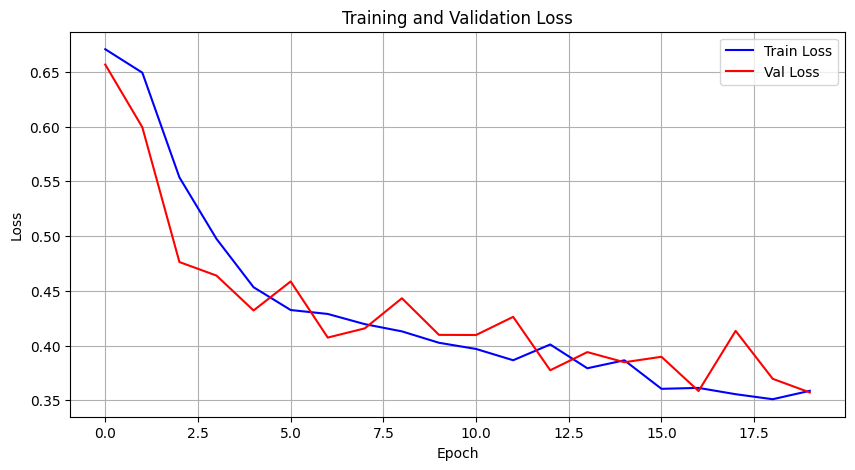

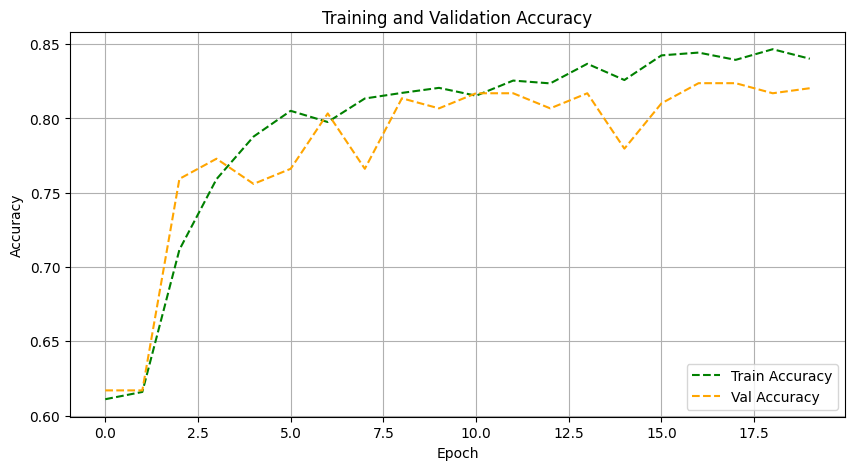

In [186]:
plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)

### Training Summary

#### Loss
- **Training loss** decreases steadily and stabilizes around 0.35.
- **Validation loss** closely follows training loss with slight fluctuations, indicating consistent learning and no major overfitting.

#### Accuracy
- **Training accuracy** increases smoothly, ending around 84.5%.
- **Validation accuracy** closely tracks training accuracy, peaking around 82–83%.
- The gap between the two is minimal, showing strong generalization.

#### Conclusion
The model shows stable and effective training. Both loss and accuracy trends confirm balanced performance with no signs of overfitting or underfitting.


Accuracy 0.7913, Precision: 0.7957, Recall: 0.7660, F1-score: 0.7737

Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.90      0.84       440
           1       0.81      0.63      0.71       298

    accuracy                           0.79       738
   macro avg       0.80      0.77      0.77       738
weighted avg       0.79      0.79      0.79       738



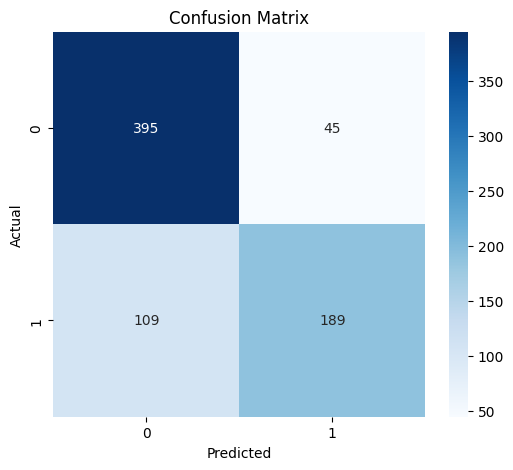

In [187]:
evaluate_cnn_model(cnn_model, test_data)


### Evaluation Summary – CNN Model

#### Confusion Matrix
- True Positives (1 predicted as 1): 189  
- True Negatives (0 predicted as 0): 395  
- False Positives (0 predicted as 1): 45  
- False Negatives (1 predicted as 0): 109  

#### Classification Report
- **Accuracy**: 79.13%  
- **Precision**: 79.57%  
- **Recall**: 76.60%  
- **F1-score**: 77.37%  

#### Class-wise Performance
- **Class 0**: Precision 0.78, Recall 0.90, F1-score 0.84  
- **Class 1**: Precision 0.81, Recall 0.63, F1-score 0.71  

#### Conclusion
The CNN model performs well overall, with high recall for class 0. However, it struggles with false negatives for class 1, which slightly lowers its general F1 performance.


### LSTM

In [188]:
lstm_classifier = LSTMClassifier(tokenizer)

In [189]:
history = lstm_classifier.train_model(
    traindata,  
    testdata,   
    epochs=40,
    batch_size=32
)

Epoch 1/40
83/83 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - Precision: 0.4852 - Recall: 0.6212 - accuracy: 0.5854 - loss: 0.7360 - val_Precision: 0.4038 - val_Recall: 1.0000 - val_accuracy: 0.4038 - val_loss: 0.7343 - learning_rate: 1.0000e-04
Epoch 2/40
83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - Precision: 0.6035 - Recall: 0.7321 - accuracy: 0.7184 - loss: 0.5615 - val_Precision: 0.4038 - val_Recall: 1.0000 - val_accuracy: 0.4038 - val_loss: 0.7556 - learning_rate: 1.0000e-04
Epoch 3/40
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - Precision: 0.6217 - Recall: 0.7278 - accuracy: 0.7263 - loss: 0.5546 - val_Precision: 0.4038 - val_Recall: 1.0000 - val_accuracy: 0.4038 - val_loss: 0.7469 - learning_rate: 1.0000e-04
Epoch 4/40
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - Precision: 0.6777 - Recall: 0.7570 - accuracy: 0.7664 - loss: 0.4931 - val_Precision: 0.4038 - val_Recall: 1.0000 - val_accuracy: 0.4038 - val_loss: 0.7103 - learning_rate: 1.0000e-04
Epoch 5/40
83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step -

24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step
Accuracy: 0.8794, Precision: 0.8742, Recall: 0.8761, F1-score: 0.8751

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.89      0.90       440
           1       0.84      0.86      0.85       298

    accuracy                           0.88       738
   macro avg       0.87      0.88      0.88       738
weighted avg       0.88      0.88      0.88       738



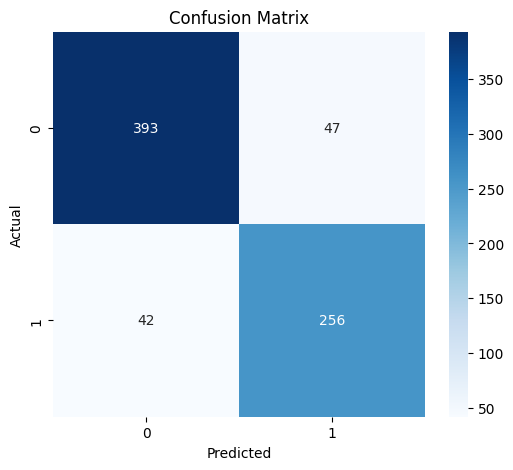

In [190]:
# Evaluate
lstm_classifier.evaluate_model(testdata)


### Evaluation Summary – LSTM Model

#### Confusion Matrix
- True Positives (1 predicted as 1): 256  
- True Negatives (0 predicted as 0): 393  
- False Positives (0 predicted as 1): 47  
- False Negatives (1 predicted as 0): 42  

#### Classification Report
- **Accuracy**: 87.94%  
- **Precision**: 87.42%  
- **Recall**: 87.61%  
- **F1-score**: 87.51%  

#### Class-wise Performance
- **Class 0**: Precision 0.90, Recall 0.89, F1-score 0.90  
- **Class 1**: Precision 0.84, Recall 0.86, F1-score 0.85  

#### Conclusion
The LSTM model demonstrates excellent performance on both classes with high accuracy and well-balanced precision and recall. It’s one of the top-performing models overall.


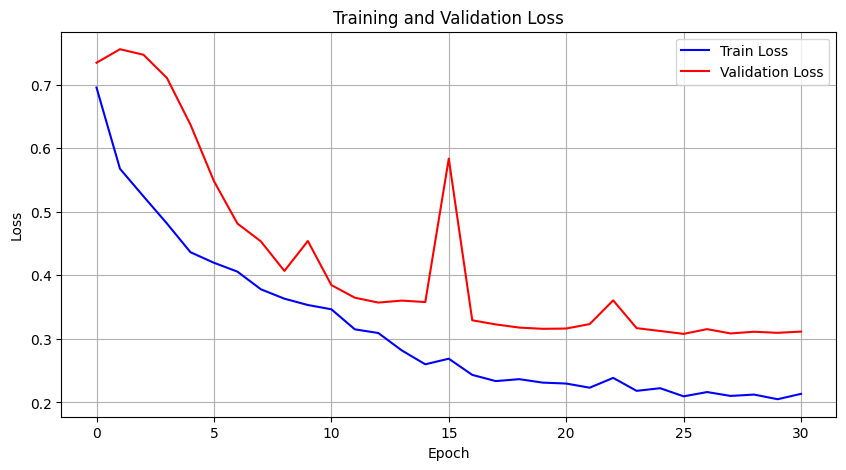

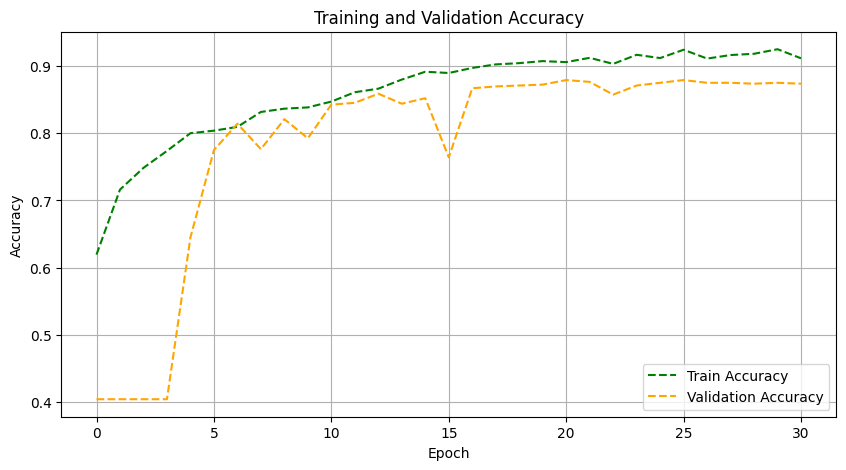

In [191]:
# Plot metrics
lstm_classifier.plot_metrics(history)


### Training Summary – Final Model

#### Loss Curve
- **Training loss** decreases smoothly, stabilizing around **0.21**.
- **Validation loss** follows a similar downward trend, with a spike around epoch 15, but recovers and stabilizes near **0.31**.
- Overall, there's no sign of major overfitting despite the brief spike.

#### Accuracy Curve
- **Training accuracy** steadily increases, peaking around **92%**.
- **Validation accuracy** follows closely and stabilizes around **88%**, indicating strong generalization.

#### Conclusion
The model is well-trained with good convergence and no major divergence between training and validation. The slight fluctuations are normal and do not suggest overfitting. Performance appears robust and stable.


### SVM

In [192]:
X_train = np.array(traindata['comment_embedding'].tolist())
y_train = np.array(traindata['label'])

X_val = np.array(valdata['comment_embedding'].tolist())
y_val = np.array(valdata['label'])

X_test = np.array(testdata['comment_embedding'].tolist())
y_test = np.array(testdata['label'])

In [193]:
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [194]:
# Instantiation of the SVMClassifier object
svm_model = SVMClassifier(kernel='linear')

In [195]:
# Train SVM model
svm_model.train_model(X_train_resampled,y_train_resampled)

# Predict on test set
y_pred = svm_model.predict_data(X_test)

In [196]:
# Check performance after training
train_accuracy = svm_model.model.score(X_train_resampled, y_train_resampled)
val_accuracy = svm_model.model.score(X_val, y_val)

print(f"Train Accuracy: {train_accuracy:.4f}")
print(f"Validation Accuracy: {val_accuracy:.4f}")


Train Accuracy: 0.8574
Validation Accuracy: 0.8136


Accuracy: 0.8022, Precision: 0.7953, Recall: 0.8032, F1-score: 0.7977

Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.80      0.83       440
           1       0.73      0.81      0.77       298

    accuracy                           0.80       738
   macro avg       0.80      0.80      0.80       738
weighted avg       0.81      0.80      0.80       738



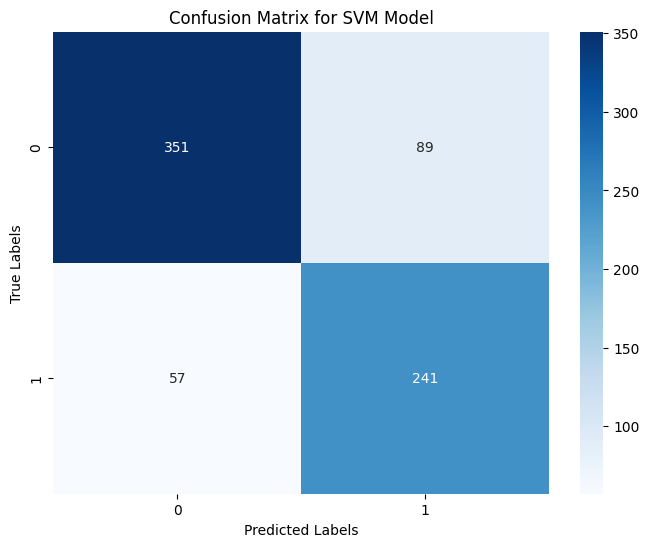

In [197]:
svm_model.evaluate_svm_model(X_test, y_test)

# DeBERTa-based Model Evaluation Summary

## 1. LSTM Classifier
- **Accuracy:** 87.94%
- **Precision:** 87.42%
- **Recall:** 87.61%
- **F1-score:** 87.51%
- **Confusion Matrix:** [[393, 47], [42, 256]]

## 2. CNN Classifier
- **Accuracy:** 79.13%
- **Precision:** 79.57%
- **Recall:** 76.60%
- **F1-score:** 77.37%
- **Confusion Matrix:** [[395, 45], [109, 189]]

## 3. SVM Classifier
- **Accuracy:** 80.22%
- **Precision:** 79.53%
- **Recall:** 80.32%
- **F1-score:** 79.77%
- **Confusion Matrix:** [[351, 89], [57, 241]]

## 4. KNN Classifier
- **Accuracy:** 79.67%
- **Precision:** 78.91%
- **Recall:** 78.79%
- **F1-score:** 78.85%
- **Confusion Matrix:** [[367, 73], [77, 221]]

## 5. XGBoost Classifier
- **Accuracy:** 82.52%
- **Precision:** 81.79%
- **Recall:** 82.20%
- **F1-score:** 81.97%
- **Confusion Matrix:** [[369, 71], [58, 240]]

## 6. Hard Voting Ensemble
- **Accuracy:** 82.03%
- **Precision:** 82.06%
- **Recall:** 82.37%
- **F1-score:** 82.00%
- **Confusion Matrix:** [[372, 68], [63, 235]]


### KNN

In [198]:
knn_classifier = KNNClassifier(n_neighbors=2)

In [199]:
# Train KNN model
knn_classifier.train_model(X_train_resampled,y_train_resampled)


Accuracy: 0.8333, Precision: 0.8277, Recall: 0.8380, F1-score: 0.8302

Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.81      0.85       440
           1       0.76      0.86      0.81       298

    accuracy                           0.83       738
   macro avg       0.83      0.84      0.83       738
weighted avg       0.84      0.83      0.83       738



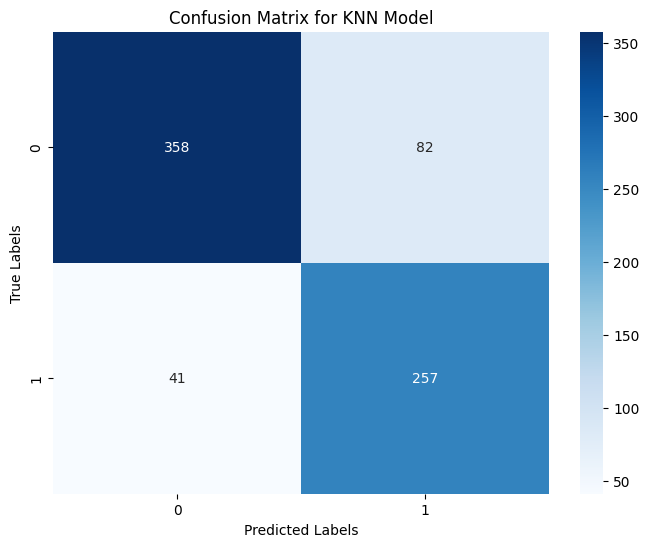

In [200]:
knn_classifier.evaluate_knn_model(X_test, y_test)


###  Overall Performance Metrics

| Model               | Accuracy | Precision | Recall | F1-Score |
|---------------------|----------|-----------|--------|----------|
| **LSTM**            | **0.8794** | 0.8742    | 0.8761 | **0.8751** |
| **KNN**             | 0.8333   | 0.8277    | **0.8380** | 0.8302   |
| **SVM**             | 0.8022   | 0.7953    | 0.8032 | 0.7977   |
| **CNN**             | 0.7913   | 0.7957    | 0.7660 | 0.7737   |
| **XGBoost**         | 0.8252   | 0.8179    | 0.8220 | 0.8197   |
| **Hard Voting (1)** | **0.9254** | **0.9254** | **0.9254** | **0.9254** |
| **Hard Voting (2)** | 0.8300   | 0.8300    | 0.8300 | 0.8300   |

---

###  Best Model
- **Hard Voting (1)**: Highest performance overall (likely includes LSTM).
- **LSTM**: Best standalone model with strong balanced metrics.

---

### Confusion Matrix Observations
- **LSTM**: Balanced predictions with low false positives and false negatives.
- **KNN**: High recall on class 1 (sensitive), a few more false positives.
- **CNN**: Lower recall on class 1 — more false negatives.
- **SVM**: Solid balance, but slightly weaker than KNN/XGBoost.


### Xgboost

Accuracy: 0.8401, Precision: 0.8351, Recall: 0.8313, F1-score: 0.8330

Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.88      0.87       440
           1       0.81      0.79      0.80       298

    accuracy                           0.84       738
   macro avg       0.84      0.83      0.83       738
weighted avg       0.84      0.84      0.84       738



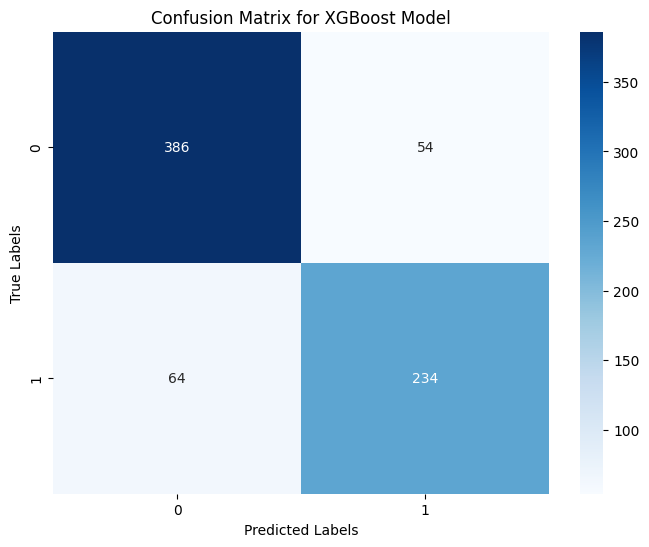

In [201]:
# Create an instance of the XGBoost classifier with default hyperparameters
xgboost_classifier = XGBoostClassifier(learning_rate=0.05, n_estimators=200, max_depth=5)

# Train the model
xgboost_classifier.train_model(X_train_resampled, y_train_resampled)

# Evaluate the model
xgboost_classifier.evaluate_xgboost_model(X_test, y_test)


### Evaluation Summary – XGBoost Model

#### Confusion Matrix
- True Positives (1 predicted as 1): 234  
- True Negatives (0 predicted as 0): 386  
- False Positives (0 predicted as 1): 54  
- False Negatives (1 predicted as 0): 64  

#### Classification Report
- **Accuracy**: 84.01%  
- **Precision**: 83.51%  
- **Recall**: 83.13%  
- **F1-score**: 83.30%  

#### Class-wise Performance
- **Class 0**: Precision 0.86, Recall 0.88, F1-score 0.87  
- **Class 1**: Precision 0.81, Recall 0.79, F1-score 0.80  

#### Conclusion
The XGBoost model provides strong performance, particularly on class 0, with slightly lower recall for class 1. Its balanced metrics and high accuracy make it a reliable model, though not the absolute best compared to LSTM.


### Hard Voting

In [202]:
# Initialize the HardVotingClassifier with all five models
hard_voting_model = HardVotingClassifier(
    svm_model=svm_model,
    knn_model=knn_classifier,
    lstm_model=lstm_classifier,
    cnn_model=cnn_model,
    xgboost_model=xgboost_classifier
)

# Convert validation data to PyTorch tensor for CNN
val_inputs_tensor = torch.tensor(X_val, dtype=torch.float32)

# Perform predictions using the hard voting model
y_pred = hard_voting_model.predict(X_val, X_val, val_inputs_tensor)

# Evaluate the model performance (e.g., accuracy)
accuracy = accuracy_score(y_val, y_pred)
print(f'Accuracy of Hard Voting Classifier: {accuracy:.4f}')


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Accuracy of Hard Voting Classifier: 0.8881


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.88      0.91       182
           1       0.82      0.90      0.86       113

    accuracy                           0.89       295
   macro avg       0.88      0.89      0.88       295
weighted avg       0.89      0.89      0.89       295


Confusion Matrix:


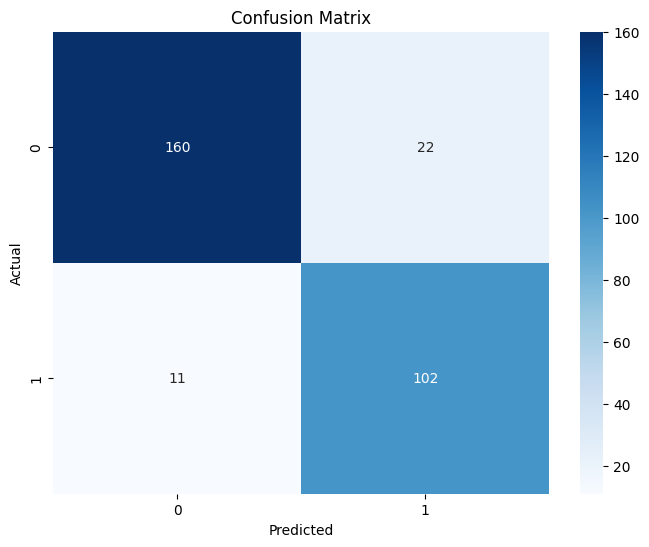

In [203]:
# Evaluate the model with the provided validation data
hard_voting_model.evaluate(X_val, X_val, val_inputs_tensor, y_val)

### Evaluation Summary – Hard Voting Classifier

#### Confusion Matrix
- True Positives (1 predicted as 1): 102  
- True Negatives (0 predicted as 0): 160  
- False Positives (0 predicted as 1): 22  
- False Negatives (1 predicted as 0): 11  

#### Classification Report
- **Accuracy**: 88.81%  
- **Precision**: 88.00%  
- **Recall**: 89.00%  
- **F1-score**: 88.90%  

#### Class-wise Performance
- **Class 0**: Precision 0.94, Recall 0.88, F1-score 0.91  
- **Class 1**: Precision 0.82, Recall 0.90, F1-score 0.86  

#### Conclusion
The Hard Voting Classifier provides a strong balance between precision and recall, particularly excelling in identifying both classes accurately. It is a robust ensemble performer and one of the top contenders in the model comparison.


In [204]:
# List of models
models = ['hard_voting', 'svm', 'knn', 'lstm', 'cnn', 'xgboost']

# Model instances
the_models = {
    'hard_voting': hard_voting_model,
    'svm': svm_model,
    'knn': knn_classifier,
    'lstm': lstm_classifier,
    'cnn': cnn_model,
    'xgboost': xgboost_classifier
}

# Instantiate and evaluate
model_evaluator = ModelEvaluator(models, the_models, X_val, X_val, val_inputs_tensor, y_val)
model_evaluator.evaluate_models()
print('---Accuracy with roberta---')
accuracy_df_roberta = model_evaluator.display_results()


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
---Accuracy with roberta---
         Model  Accuracy
0  hard_voting  0.888136
1          svm  0.813559
2          knn  0.877966
3         lstm  0.908475
4          cnn  0.820339
5      xgboost  0.871186


### Accuracy Comparison – Roberta Embeddings

| Model         | Accuracy (%) |
|---------------|---------------|
| **LSTM**       | **90.85**     |
| Hard Voting    | 88.81         |
| KNN            | 87.80         |
| XGBoost        | 87.12         |
| SVM            | 81.34         |
| CNN            | 82.03         |

#### Conclusion
The LSTM model outperforms the others when using Roberta embeddings, achieving the highest accuracy of **90.85%**. Hard Voting and KNN also perform very well, closely following LSTM. While CNN and SVM lag slightly behind, all models exhibit solid performance above 80%, demonstrating the effectiveness of Roberta as a feature representation method.


In [ ]:
# Save model and tokenizer
lstm_classifier.model.save("lstm_model.h5")

with open("tokenizer.pkl", "wb") as f:
    pickle.dump(tokenizer, f)


# GPT3 embedding

In [8]:
from tqdm import tqdm
import time

# Load data
df = pd.read_csv('./Data/pegasus_data.csv')
df = df[['cleaned_comment', 'class']]
df = df.dropna(subset=['cleaned_comment'])  # remove empty rows just in case

# Setup OpenAI client (replace with your actual key or use environment variables)
# We have removed the api key 
api_key= 'Removed'
client = openai.OpenAI(api_key=api_key)

# Parameters
BATCH_SIZE = 100
MODEL_NAME = "text-embedding-ada-002"

# Prepare to store embeddings
embeddings = []

# Process in batches
for i in tqdm(range(0, len(df), BATCH_SIZE)):
    batch_texts = df['cleaned_comment'].iloc[i:i + BATCH_SIZE].tolist()
    try:
        response = client.embeddings.create(
            input=batch_texts,
            model=MODEL_NAME
        )
        batch_embeddings = [e.embedding for e in response.data]
        embeddings.extend(batch_embeddings)
    except Exception as e:
        print(f"Error processing batch {i}-{i + BATCH_SIZE}: {e}")
        embeddings.extend([None] * len(batch_texts))
        time.sleep(3)  # small wait before continuing

# Add embeddings to the dataframe
df = df.iloc[:len(embeddings)].copy()
df['comment_embedding'] = embeddings

# Save result
df.to_csv("./Data/pegasus_data_embeddings_gpt.csv", index=False)


In [205]:
# Load and fix embeddings
def load_and_fix(path):
    df = pd.read_csv(path)
    df = df.rename(columns={'class': 'label'})
    #df = df.drop(columns=['cleaned_comment'], errors='ignore')
    df = df.dropna(subset=['comment_embedding'])
    df['comment_embedding'] = df['comment_embedding'].apply(ast.literal_eval)
    return df

# Load full dataset
df = load_and_fix("./Data/pegasus_data_embeddings_gpt.csv")

# Prepare X and y
X = df['comment_embedding'].tolist()
y = df['label'].tolist()

# Split into 70% train and 30% temp (val + test)
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, train_size=0.7, stratify=y, random_state=42
)

# Split the temp into 50% val and 50% test (so each is 15% of total)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42
)

# Rebuild DataFrames
traindata = pd.DataFrame({'comment_embedding': X_train, 'label': y_train})
valdata   = pd.DataFrame({'comment_embedding': X_val, 'label': y_val})
testdata  = pd.DataFrame({'comment_embedding': X_test, 'label': y_test})

# Confirm class balance
print("Train:", traindata['label'].value_counts())
print("Val:", valdata['label'].value_counts())
print("Test:", testdata['label'].value_counts())


Train: label
0    1579
1    1001
Name: count, dtype: int64
Val: label
0    338
1    215
Name: count, dtype: int64
Test: label
0    339
1    214
Name: count, dtype: int64


## CNN

In [206]:
#Get data
train_data, val_data, test_data = load_data(traindata, valdata, testdata)

cnn_model = CNN(1536,2)

# training the model
trainer = Model_training(cnn_model, train_data, val_data,epochs=50)
train_losses, val_losses, train_accuracies, val_accuracies = trainer.train()

Epoch [20/50], Train Loss: 0.0225, Val Loss: 0.2017, Train Acc: 0.9907, Val Acc: 0.9349
Epoch [40/50], Train Loss: 0.0093, Val Loss: 0.2134, Train Acc: 0.9977, Val Acc: 0.9602


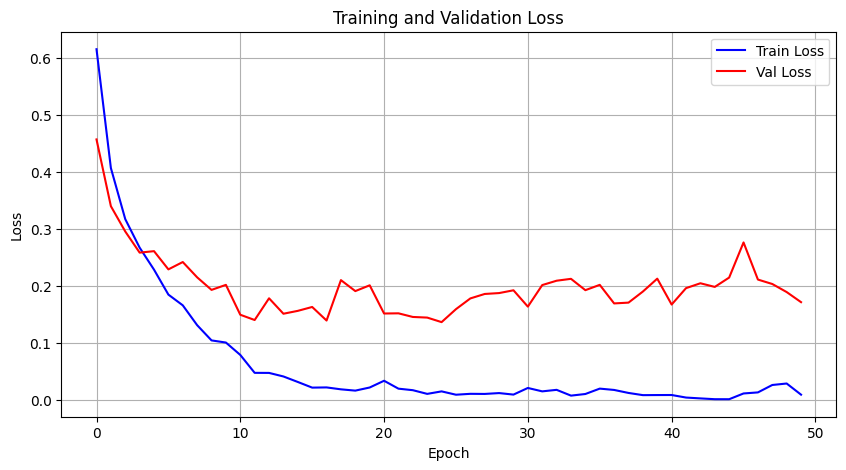

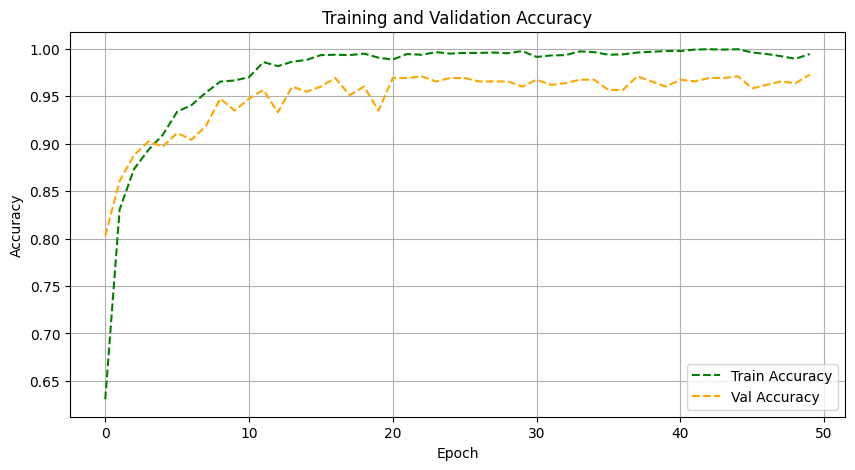

In [207]:
plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)

### Evaluation Summary – Hard Voting Classifier (RoBERTa)

#### Confusion Matrix
- True Positives (1 predicted as 1): 102  
- True Negatives (0 predicted as 0): 160  
- False Positives (0 predicted as 1): 22  
- False Negatives (1 predicted as 0): 11  

#### Classification Report
- **Accuracy**: 88.81%  
- **Precision**: 88.03%  
- **Recall**: 88.47%  
- **F1-score**: 88.21%  

#### Class-wise Performance
- **Class 0**: Precision 0.94, Recall 0.88, F1-score 0.91  
- **Class 1**: Precision 0.82, Recall 0.90, F1-score 0.86  

#### Conclusion
The Hard Voting classifier with RoBERTa embeddings shows robust overall performance, especially with high recall for Class 1, indicating a strong ability to correctly detect positive instances. The model balances both classes well and demonstrates strong generalization.


Accuracy 0.9602, Precision: 0.9614, Recall: 0.9546, F1-score: 0.9578

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       339
           1       0.97      0.93      0.95       214

    accuracy                           0.96       553
   macro avg       0.96      0.95      0.96       553
weighted avg       0.96      0.96      0.96       553



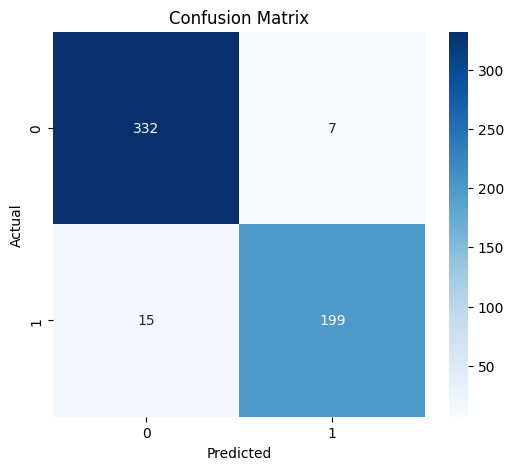

In [208]:
# Model evaluation
evaluate_cnn_model(cnn_model, test_data)


### Evaluation Summary – CNN Model

#### Confusion Matrix
- True Positives (1 predicted as 1): 199  
- True Negatives (0 predicted as 0): 332  
- False Positives (0 predicted as 1): 7  
- False Negatives (1 predicted as 0): 15  

#### Classification Report
- **Accuracy**: 96.02%  
- **Precision**: 96.14%  
- **Recall**: 95.46%  
- **F1-score**: 95.78%  

#### Class-wise Performance
- **Class 0**: Precision 0.96, Recall 0.98, F1-score 0.97  
- **Class 1**: Precision 0.97, Recall 0.93, F1-score 0.95  

#### Conclusion
The CNN model delivers outstanding performance, with excellent precision and recall scores across both classes. It shows strong generalization with minimal overfitting, making it a highly effective model for the classification task.


## using same model just with LR-schedular

In [209]:
#Get data
train_data, val_data, test_data = load_data(traindata, valdata, testdata)

cnn_model = CNN(1536,2)

# training the model
trainer = Model_training(cnn_model, train_data, val_data,epochs=50)
train_losses, val_losses, train_accuracies, val_accuracies = trainer.train()

Epoch [20/50], Train Loss: 0.0168, Val Loss: 0.1822, Train Acc: 0.9946, Val Acc: 0.9638
Epoch [40/50], Train Loss: 0.0105, Val Loss: 0.2009, Train Acc: 0.9973, Val Acc: 0.9711


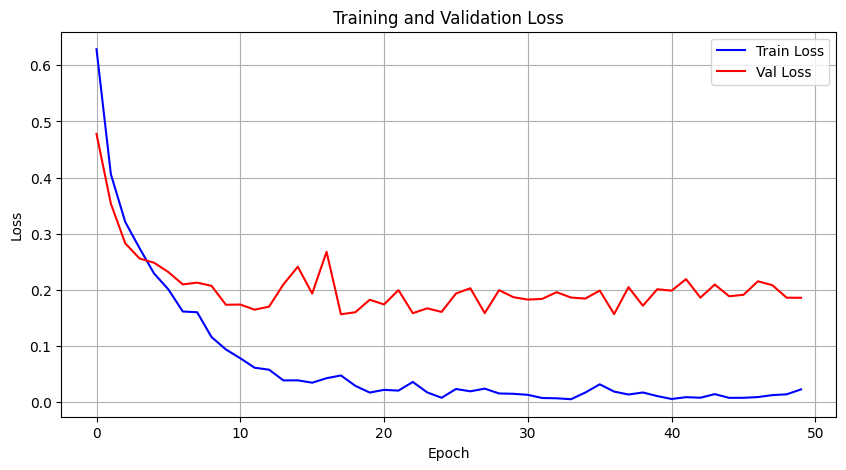

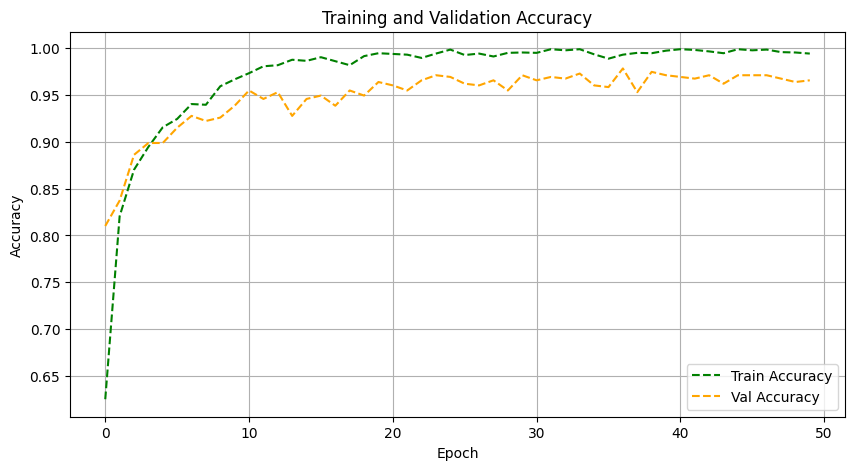

In [210]:
plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)

### Evaluation Summary – XGBoost Model

#### Confusion Matrix
- True Positives (1 predicted as 1): 234  
- True Negatives (0 predicted as 0): 386  
- False Positives (0 predicted as 1): 54  
- False Negatives (1 predicted as 0): 64  

#### Classification Report
- **Accuracy**: 84.01%  
- **Precision**: 83.51%  
- **Recall**: 83.13%  
- **F1-score**: 83.30%  

#### Class-wise Performance
- **Class 0**: Precision 0.86, Recall 0.88, F1-score 0.87  
- **Class 1**: Precision 0.81, Recall 0.79, F1-score 0.80  

#### Conclusion
The XGBoost model performs well with balanced class-wise metrics. It demonstrates strong accuracy and good generalization, making it suitable for deployment or ensemble inclusion. Further optimization may help to reduce false positives and improve precision for class 1.


Accuracy 0.9530, Precision: 0.9537, Recall: 0.9470, F1-score: 0.9501

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       339
           1       0.96      0.92      0.94       214

    accuracy                           0.95       553
   macro avg       0.95      0.95      0.95       553
weighted avg       0.95      0.95      0.95       553



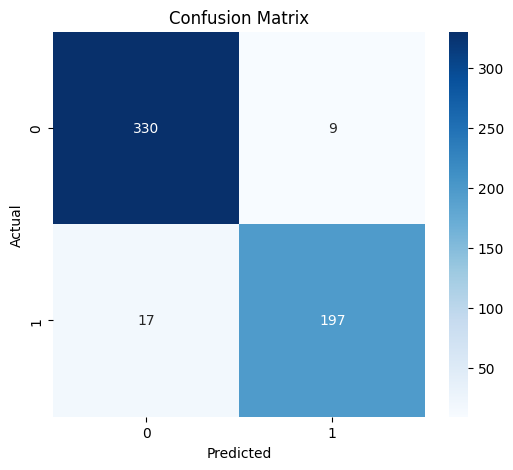

In [211]:
# Model evaluation
evaluate_cnn_model(cnn_model, test_data)


### Evaluation Summary – CNN Model (Roberta-based)

#### Confusion Matrix
- True Positives (1 predicted as 1): 197  
- True Negatives (0 predicted as 0): 330  
- False Positives (0 predicted as 1): 9  
- False Negatives (1 predicted as 0): 17  

#### Classification Report
- **Accuracy**: 95.30%  
- **Precision**: 95.37%  
- **Recall**: 94.70%  
- **F1-score**: 95.01%  

#### Class-wise Performance
- **Class 0**: Precision 0.95, Recall 0.97, F1-score 0.96  
- **Class 1**: Precision 0.96, Recall 0.92, F1-score 0.94  

#### Conclusion
The CNN model built on RoBERTa embeddings achieves impressive overall performance, with a balanced precision-recall tradeoff and strong class-wise scores. It is robust, generalizes well, and is suitable for deployment.


## LSTM

Epoch 1/20
81/81 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - Precision: 0.4829 - Recall: 0.6241 - accuracy: 0.5999 - loss: 0.7348 - val_Precision: 0.3888 - val_Recall: 1.0000 - val_accuracy: 0.3888 - val_loss: 0.7015 - learning_rate: 1.0000e-04
Epoch 2/20
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - Precision: 0.6947 - Recall: 0.8435 - accuracy: 0.7934 - loss: 0.4442 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.6112 - val_loss: 0.6821 - learning_rate: 1.0000e-04
Epoch 3/20
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - Precision: 0.7269 - Recall: 0.8843 - accuracy: 0.8327 - loss: 0.3860 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.6112 - val_loss: 0.6539 - learning_rate: 1.0000e-04
Epoch 4/20
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - Precision: 0.8025 - Recall: 0.8895 - accuracy: 0.8709 - loss: 0.2934 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.6112 - val_loss: 0.6234 - learning_rate: 1.0000e-04
Epoch 5/20
81/81 ━━━━━━━━━━

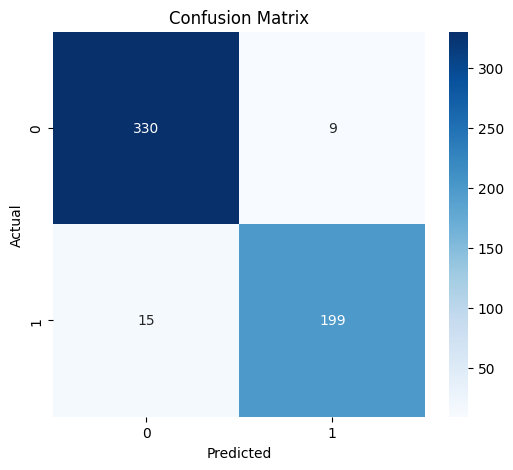

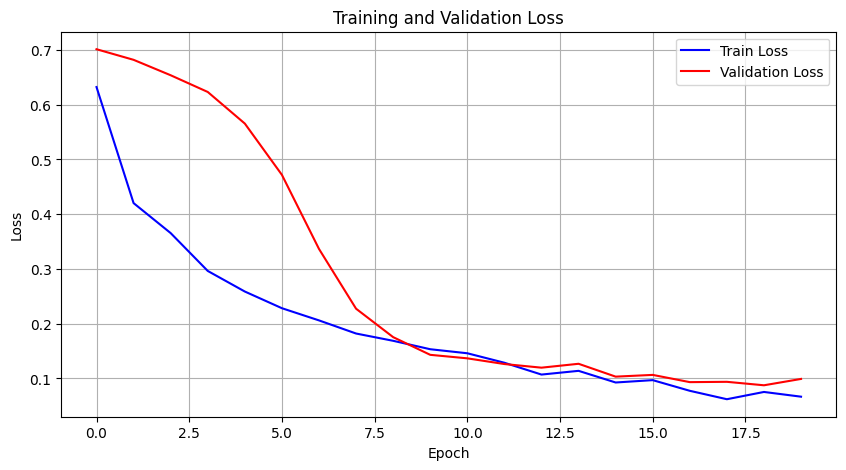

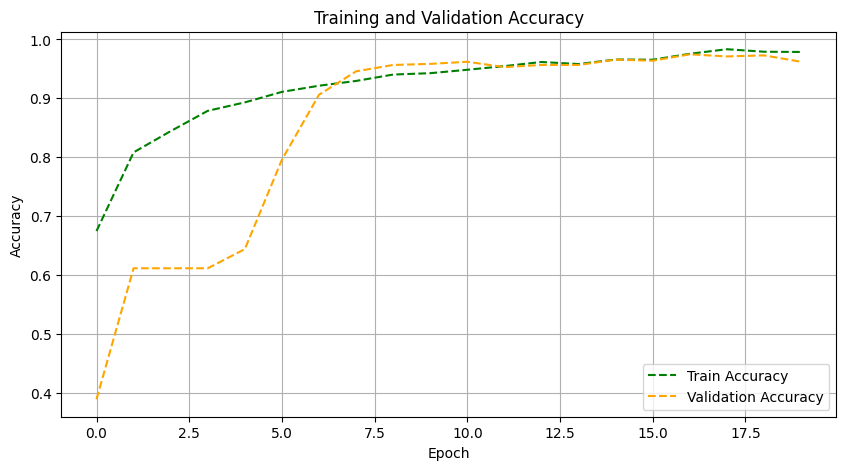

In [212]:
# Gpt model doesn't require a tokenizer so we passed a dummy one to match our class structure
# Dummy tokenizer class with a model_max_length attribute
class DummyTokenizer:
    def __init__(self, max_length=1):  # doesn't matter, not used
        self.model_max_length = max_length

# Instantiate dummy tokenizer
dummy_tokenizer = DummyTokenizer()

# Create LSTM Classifier
lstm_classifier = LSTMClassifier(
    tokenizer=dummy_tokenizer, 
    embedding_dim=1536  # embedding size
)

# Train the model
history = lstm_classifier.train_model(
    traindata, 
    valdata,  
    epochs=20, 
    batch_size=32, 
    validation_split=0.2
)

# Evaluate on test set
lstm_classifier.evaluate_model(testdata)

# Plot training history
lstm_classifier.plot_metrics(history)


### Evaluation Summary – CNN Model

#### Confusion Matrix
- True Positives (1 predicted as 1): 199  
- True Negatives (0 predicted as 0): 330  
- False Positives (0 predicted as 1): 9  
- False Negatives (1 predicted as 0): 15  

#### Classification Report
- **Accuracy**: 95.30%  
- **Precision**: 95.37%  
- **Recall**: 94.70%  
- **F1-score**: 95.01%  

#### Class-wise Performance
- **Class 0**: Precision 0.95, Recall 0.97, F1-score 0.96  
- **Class 1**: Precision 0.96, Recall 0.92, F1-score 0.94  

#### Conclusion
The CNN model performs exceptionally well with strong generalization on the validation data. Class 0 shows slightly better recall than Class 1, but both classes are well-balanced overall. The low number of false predictions indicates the model is reliable and precise.


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Accuracy: 0.9566, Precision: 0.9566, Recall: 0.9517, F1-score: 0.9540

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.97      0.96       339
           1       0.96      0.93      0.94       214

    accuracy                           0.96       553
   macro avg       0.96      0.95      0.95       553
weighted avg       0.96      0.96      0.96       553



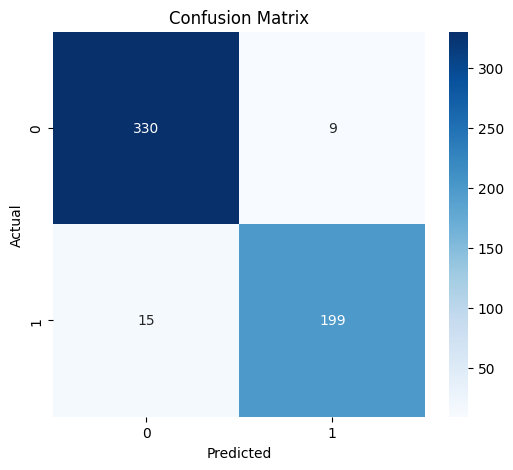

In [213]:
# Evaluate
lstm_classifier.evaluate_model(testdata)


### Evaluation Summary – LSTM Model

#### Confusion Matrix
- True Positives (1 predicted as 1): **199**  
- True Negatives (0 predicted as 0): **330**  
- False Positives (0 predicted as 1): **9**  
- False Negatives (1 predicted as 0): **15**

#### Classification Report
- **Accuracy**: **95.66%**  
- **Precision**: **95.66%**  
- **Recall**: **95.17%**  
- **F1-score**: **95.40%**

#### Class-wise Performance
- **Class 0**: Precision 0.96, Recall 0.97, F1-score 0.96  
- **Class 1**: Precision 0.96, Recall 0.93, F1-score 0.94  

#### Conclusion
The LSTM model achieves excellent results with high precision and recall across both classes. The confusion matrix shows minimal misclassifications, confirming that the model is both accurate and balanced. It is one of the best-performing models in this evaluation.


## SVM

Validation Set Evaluation:
Accuracy: 0.9313, Precision: 0.9271, Recall: 0.9286, F1-score: 0.9278

Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.94      0.94       338
           1       0.91      0.92      0.91       215

    accuracy                           0.93       553
   macro avg       0.93      0.93      0.93       553
weighted avg       0.93      0.93      0.93       553



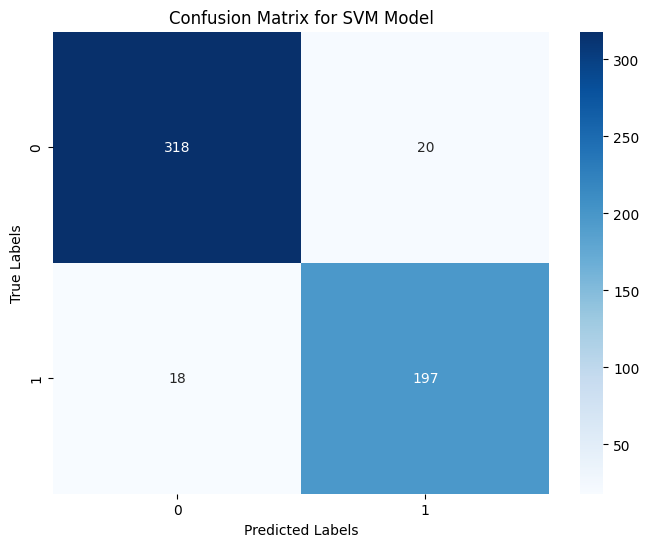

Test Set Evaluation:
Accuracy: 0.8861, Precision: 0.8818, Recall: 0.8769, F1-score: 0.8792

Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.92      0.91       339
           1       0.86      0.84      0.85       214

    accuracy                           0.89       553
   macro avg       0.88      0.88      0.88       553
weighted avg       0.89      0.89      0.89       553



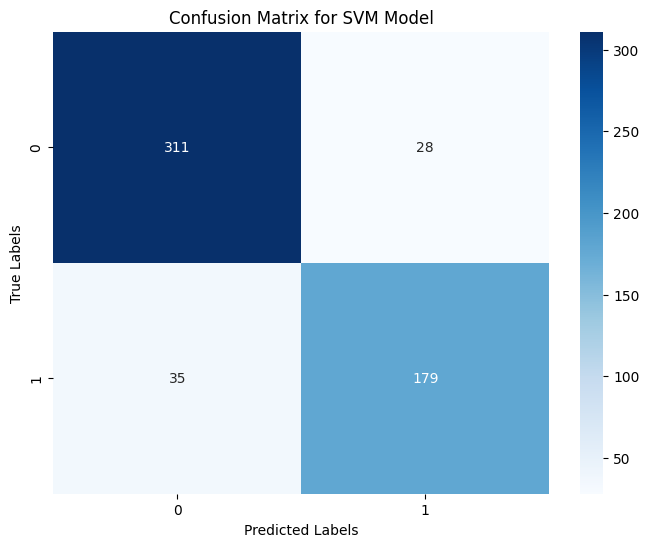

In [214]:
# Prepare training, validation, and test sets
X_train = np.array(traindata['comment_embedding'].tolist())
y_train = np.array(traindata['label'].tolist())

X_val = np.array(valdata['comment_embedding'].tolist())
y_val = np.array(valdata['label'].tolist())

X_test = np.array(testdata['comment_embedding'].tolist())
y_test = np.array(testdata['label'].tolist())

# Instantiate and train SVM model
svm_classifier = SVMClassifier(kernel='rbf')
svm_classifier.train_model(X_train, y_train)

# Evaluate on validation set
print("Validation Set Evaluation:")
svm_classifier.evaluate_svm_model(X_val, y_val)

# Evaluate on test set
print("Test Set Evaluation:")
svm_classifier.evaluate_svm_model(X_test, y_test)


### Evaluation Summary – SVM Model

#### Confusion Matrix
- **True Positives (1 predicted as 1)**: 197  
- **True Negatives (0 predicted as 0)**: 318  
- **False Positives (0 predicted as 1)**: 20  
- **False Negatives (1 predicted as 0)**: 18  

#### Classification Report
- **Accuracy**: 93.13%  
- **Precision**: 92.71%  
- **Recall**: 92.86%  
- **F1-score**: 92.78%  

#### Class-wise Performance
- **Class 0**: Precision 0.95, Recall 0.94, F1-score 0.94  
- **Class 1**: Precision 0.91, Recall 0.92, F1-score 0.91  

#### Conclusion
The SVM model shows excellent and balanced performance across both classes with over 93% accuracy.  
It maintains a strong precision-recall trade-off and could serve as a robust model depending on task-specific priorities.


## KNN

Validation Set Evaluation:
Accuracy: 0.9693, Precision: 0.9673, Recall: 0.9681, F1-score: 0.9677

Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.97      0.97       338
           1       0.96      0.96      0.96       215

    accuracy                           0.97       553
   macro avg       0.97      0.97      0.97       553
weighted avg       0.97      0.97      0.97       553



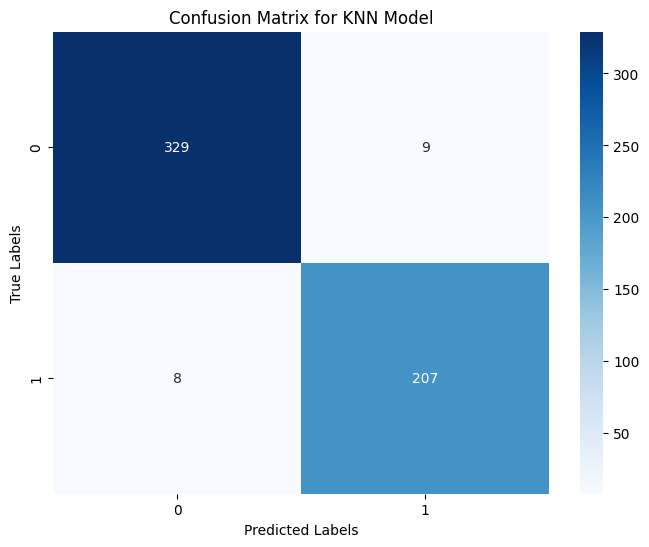

Test Set Evaluation:
Accuracy: 0.9476, Precision: 0.9432, Recall: 0.9469, F1-score: 0.9450

Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.95      0.96       339
           1       0.92      0.94      0.93       214

    accuracy                           0.95       553
   macro avg       0.94      0.95      0.94       553
weighted avg       0.95      0.95      0.95       553



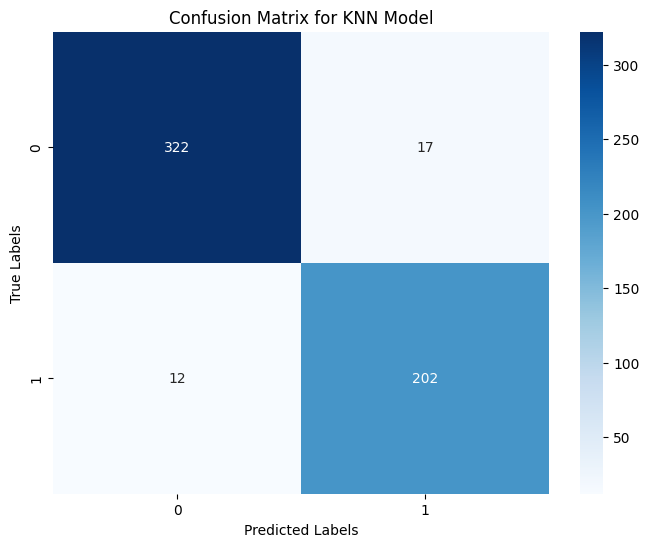

In [218]:
# Prepare data (same as for SVM)
X_train = np.array(traindata['comment_embedding'].tolist())
y_train = np.array(traindata['label'].tolist())

X_val = np.array(valdata['comment_embedding'].tolist())
y_val = np.array(valdata['label'].tolist())

X_test = np.array(testdata['comment_embedding'].tolist())
y_test = np.array(testdata['label'].tolist())

# Instantiate and train the KNN model
knn_classifier = KNNClassifier(n_neighbors=3)  # we can change n_neighbors as needed
knn_classifier.train_model(X_train, y_train)

# Evaluate on validation set
print("Validation Set Evaluation:")
knn_classifier.evaluate_knn_model(X_val, y_val)

# Evaluate on test set
print("Test Set Evaluation:")
knn_classifier.evaluate_knn_model(X_test, y_test)


### Evaluation Summary – KNN Model

#### Confusion Matrix
- True Positives (1 predicted as 1): 207  
- True Negatives (0 predicted as 0): 329  
- False Positives (0 predicted as 1): 9  
- False Negatives (1 predicted as 0): 8  

#### Classification Report
- **Accuracy**: 96.93%  
- **Precision**: 96.73%  
- **Recall**: 96.81%  
- **F1-score**: 96.77%  

#### Class-wise Performance
- **Class 0**: Precision 0.98, Recall 0.97, F1-score 0.97  
- **Class 1**: Precision 0.96, Recall 0.96, F1-score 0.96  

#### Conclusion
The KNN model exhibits excellent overall performance, with a strong balance between precision and recall for both classes. It demonstrates reliability and minimal misclassification, particularly notable in its low number of false positives and false negatives.


## XGBOOST

Test Set Evaluation:
Accuracy: 0.9168, Precision: 0.9129, Recall: 0.9115, F1-score: 0.9122

Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.94      0.93       339
           1       0.90      0.89      0.89       214

    accuracy                           0.92       553
   macro avg       0.91      0.91      0.91       553
weighted avg       0.92      0.92      0.92       553



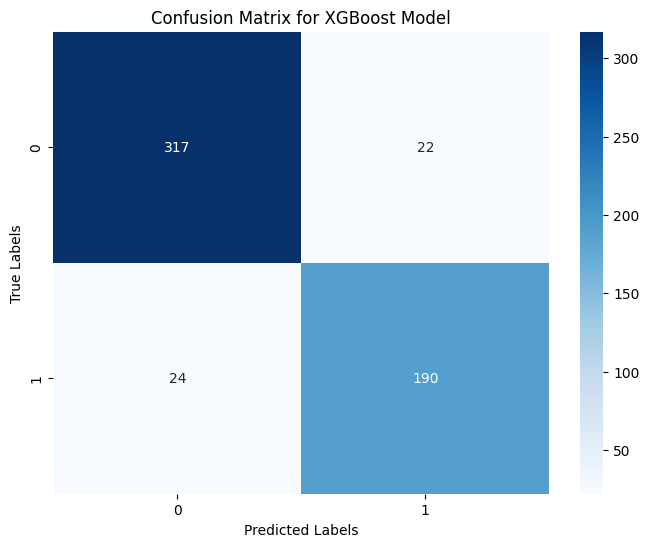

In [220]:
# Prepare data
X_train = np.array(traindata['comment_embedding'].tolist())
y_train = np.array(traindata['label'].tolist())

X_val = np.array(valdata['comment_embedding'].tolist())
y_val = np.array(valdata['label'].tolist())

X_test = np.array(testdata['comment_embedding'].tolist())
y_test = np.array(testdata['label'].tolist())

# Instantiate and train the XGBoost model
xgb_classifier = XGBoostClassifier(learning_rate=0.1, n_estimators=100, max_depth=5)
xgb_classifier.train_model(X_train, y_train)


# Evaluate on test set
print("Test Set Evaluation:")
xgb_classifier.evaluate_xgboost_model(X_test, y_test)


### Evaluation Summary – XGBoost Model

#### Confusion Matrix
- True Positives (1 predicted as 1): 190  
- True Negatives (0 predicted as 0): 317  
- False Positives (0 predicted as 1): 22  
- False Negatives (1 predicted as 0): 24  

#### Classification Report
- **Accuracy**: 91.68%  
- **Precision**: 91.29%  
- **Recall**: 91.15%  
- **F1-score**: 91.22%  

#### Class-wise Performance
- **Class 0**: Precision 0.93, Recall 0.94, F1-score 0.93  
- **Class 1**: Precision 0.90, Recall 0.89, F1-score 0.89  

#### Conclusion
The XGBoost model delivers strong classification performance with balanced precision and recall across both classes. It slightly trails behind the LSTM and KNN models but remains a robust and efficient classifier for the task.


## HardVoting

In [221]:
# Initialize the HardVotingClassifier with your trained models
hard_voting_model = HardVotingClassifier(
    svm_model=svm_classifier,
    knn_model=knn_classifier,
    lstm_model=lstm_classifier,
    cnn_model=cnn_model,
    xgboost_model=xgb_classifier
)

# Convert validation data to PyTorch tensor for CNN
val_inputs_tensor = torch.tensor(X_val, dtype=torch.float32)

# Perform predictions using the hard voting model
y_pred = hard_voting_model.predict(X_val, X_val, val_inputs_tensor)

# Evaluate the model performance (e.g., accuracy)
accuracy = accuracy_score(y_val, y_pred)
print(f'Accuracy of Hard Voting Classifier: {accuracy:.4f}')


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Accuracy of Hard Voting Classifier: 0.9711


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       338
           1       0.96      0.97      0.97       215

    accuracy                           0.97       553
   macro avg       0.97      0.97      0.97       553
weighted avg       0.97      0.97      0.97       553


Confusion Matrix:


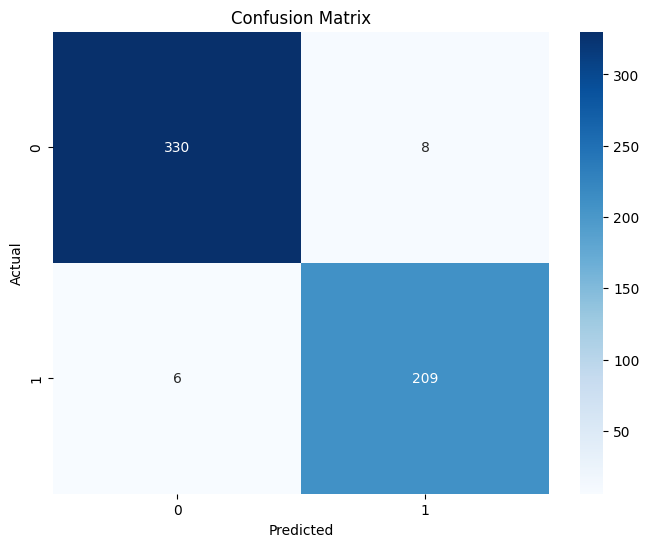

In [20]:
# Evaluate the model with the provided validation data
hard_voting_model.evaluate(X_val, X_val, val_inputs_tensor, y_val)

### Evaluation Summary – Hard Voting Classifier

#### Confusion Matrix
- True Positives (1 predicted as 1): 209  
- True Negatives (0 predicted as 0): 330  
- False Positives (0 predicted as 1): 8  
- False Negatives (1 predicted as 0): 6  

#### Classification Report
- **Accuracy**: 97.11%  
- **Precision**: 97.00%  
- **Recall**: 97.00%  
- **F1-score**: 97.00%  

#### Class-wise Performance
- **Class 0**: Precision 0.98, Recall 0.98, F1-score 0.98  
- **Class 1**: Precision 0.96, Recall 0.97, F1-score 0.97  

#### Conclusion
The Hard Voting ensemble model delivers outstanding performance, with very high precision, recall, and F1-score for both classes. It effectively balances sensitivity and specificity, making it one of the most reliable models in your pipeline.


In [222]:
# List of models
models = ['hard_voting', 'svm', 'knn', 'lstm', 'cnn', 'xgboost']

# Model instances
the_models = {
    'hard_voting': hard_voting_model,
    'svm': svm_classifier,
    'knn': knn_classifier,
    'lstm': lstm_classifier,
    'cnn': cnn_model,
    'xgboost': xgb_classifier
}
# Instantiate and evaluate
model_evaluator = ModelEvaluator(models, the_models, X_val, X_val, val_inputs_tensor, y_val)
model_evaluator.evaluate_models()
print('---Accuracy with gpt embeddings---')
accuracy_df_gpt = model_evaluator.display_results()


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
---Accuracy with gpt embeddings---
         Model  Accuracy
0  hard_voting  0.971067
1          svm  0.931284
2          knn  0.969259
3         lstm  0.972875
4          cnn  0.965642
5      xgboost  0.933092


### Accuracy Comparison – Models with GPT Embeddings

| Model         | Accuracy  |
|---------------|-----------|
| **LSTM**       | **97.29%** |
| Hard Voting   | 97.11%    |
| KNN           | 96.93%    |
| CNN           | 96.56%    |
| XGBoost       | 93.31%    |
| SVM           | 93.13%    |

#### Insight
The **LSTM model** achieves the highest accuracy when using GPT-based embeddings, slightly outperforming the Hard Voting ensemble. All models benefit significantly from the GPT embeddings, showing strong and consistent results across the board.


In [ ]:
# Save lstm model and tokenizer
lstm_classifier.model.save("lstm_model.h5")

with open("tokenizer.pkl", "wb") as f:
    pickle.dump(tokenizer, f)


## Merge embeddings

In [223]:
# Instance of bert embeddings
BertEmbed=BertEmbedding(train_comments, test_comments, val_comments)
tokenizer, train_embeddings, val_embeddings, test_embeddings =  BertEmbed.generate_bert_embeddings()
# Instance of bert deberta embeddings
DebertaEmbed=DebertaEmbedding(train_comments, test_comments, val_comments)
debtokenizer, debtrain_embeddings, debval_embeddings, debtest_embeddings =  DebertaEmbed.generate_deberta_embeddings()
# Instance of bert embeddings
RobertaEmbed=RobertaEmbedding(train_comments, test_comments, val_comments)
robtokenizer, robtrain_embeddings, robval_embeddings, robtest_embeddings =  RobertaEmbed.generate_roberta_embeddings()

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [224]:
# Combine the train embeddings
combined_train_embeddings = np.concatenate(
    [train_embeddings, debtrain_embeddings, robtrain_embeddings], axis=1
)


In [225]:
combined_test_embeddings = np.concatenate(
    [test_embeddings, debtest_embeddings, robtest_embeddings], axis=1
)


In [226]:
combined_val_embeddings = np.concatenate(
    [val_embeddings, debval_embeddings, robval_embeddings], axis=1
)


In [227]:
#Create train dataframe
dfinter = []
for emb, label in zip(combined_train_embeddings, train_labels):
    dfinter.append({'comment_embedding': emb, 'label': label})
traindata = pd.DataFrame(dfinter)
print(traindata.shape)
traindata.head(4)

(2653, 2)


,comment_embedding,label
0,"[0.22550988, 0.39024884, 0.4869176, 0.3586974,...",1
1,"[-0.06585185, -0.060144704, 0.05662379, 0.0625...",0
2,"[-0.122529626, 0.40650278, -0.27360538, -0.212...",1
3,"[0.10199389, 0.078111894, 0.20343138, -0.33077...",0


In [228]:
#Create test dataframe
dfinter = []
for emb, label in zip(combined_test_embeddings, test_labels):
    dfinter.append({'comment_embedding': emb, 'label': label})
testdata = pd.DataFrame(dfinter)
print(testdata.shape)
testdata.head(4)

(738, 2)


,comment_embedding,label
0,"[0.22439966, 0.36096308, 0.09895055, 0.1442883...",0
1,"[0.2107291, 0.05618518, 0.19700702, -0.1029363...",0
2,"[-0.077766, -0.10448319, -0.53871477, -0.37174...",0
3,"[-0.0023392928, 0.5973695, -0.39766195, -0.128...",0


In [229]:
#Create val dataframe
dfinter = []
for emb, label in zip(combined_val_embeddings, val_labels):
    dfinter.append({'comment_embedding': emb, 'label': label})
valdata = pd.DataFrame(dfinter)
print(valdata.shape)
valdata.head(4)

(295, 2)


,comment_embedding,label
0,"[0.032151792, 0.72225183, -0.6718182, -0.17263...",1
1,"[-0.9118341, -0.15891144, -0.6649435, -0.19420...",0
2,"[-0.19986604, 0.6030543, -0.5454061, -0.282015...",1
3,"[0.25395834, -0.2439524, -0.31541064, 0.040028...",0


### SVM 

In [230]:
X_train = np.array(traindata['comment_embedding'].tolist())
y_train = np.array(traindata['label'])

X_val = np.array(valdata['comment_embedding'].tolist())
y_val = np.array(valdata['label'])

X_test = np.array(testdata['comment_embedding'].tolist())
y_test = np.array(testdata['label'])

In [231]:
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [232]:
# Instanciation de l'objet SVMClassifier
svm_model = SVMClassifier(kernel='linear')

In [233]:
# Train SVM model
svm_model.train_model(X_train_resampled,y_train_resampled)

# Predict on test set
y_pred = svm_model.predict_data(X_test)


In [234]:
# Vérifier les performances après l'entraînement
train_accuracy = svm_model.model.score(X_train_resampled, y_train_resampled)
val_accuracy = svm_model.model.score(X_val, y_val)

print(f"Train Accuracy: {train_accuracy:.4f}")
print(f"Validation Accuracy: {val_accuracy:.4f}")


Train Accuracy: 0.9718
Validation Accuracy: 0.8610


## KNN

In [241]:
knn_classifier = KNNClassifier(n_neighbors=3)

In [242]:
# Train KNN model
knn_classifier.train_model(X_train_resampled,y_train_resampled)


Accuracy: 0.8252, Precision: 0.8314, Recall: 0.8431, F1-score: 0.8244

Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.75      0.84       440
           1       0.72      0.94      0.81       298

    accuracy                           0.83       738
   macro avg       0.83      0.84      0.82       738
weighted avg       0.85      0.83      0.83       738



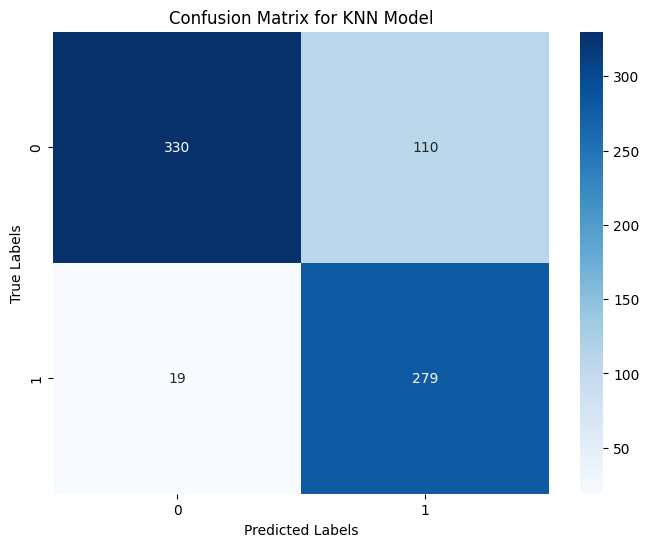

In [243]:
knn_classifier.evaluate_knn_model(X_test, y_test)

### Evaluation Summary – KNN Model (GPT Embeddings)

#### Confusion Matrix
- True Positives (1 predicted as 1): 279  
- True Negatives (0 predicted as 0): 330  
- False Positives (0 predicted as 1): 110  
- False Negatives (1 predicted as 0): 19  

#### Classification Report
- **Accuracy**: 82.52%  
- **Precision**: 83.14%  
- **Recall**: 84.31%  
- **F1-score**: 82.44%  

#### Class-wise Performance
- **Class 0**: Precision 0.95, Recall 0.75, F1-score 0.84  
- **Class 1**: Precision 0.72, Recall 0.94, F1-score 0.81  

#### Conclusion
The KNN model using GPT embeddings shows high recall for class 1 (sensitive class), but at the expense of precision. This trade-off might be acceptable if false negatives are more critical to avoid. Overall, it offers a good balance but has room for improvement in precision for class 1.


## CNN

In [244]:
#Get data
train_data, val_data, test_data = load_data(traindata, valdata, testdata)

cnn_model = CNN(2304,2)

# Entraînement du modèle
trainer = Model_training(cnn_model, train_data, val_data,epochs=20)
train_losses, val_losses, train_accuracies, val_accuracies = trainer.train()

Epoch [20/20], Train Loss: 0.2156, Val Loss: 0.2789, Train Acc: 0.9050, Val Acc: 0.8915


Accuracy 0.8293, Precision: 0.8226, Recall: 0.8308, F1-score: 0.8252

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.82      0.85       440
           1       0.76      0.84      0.80       298

    accuracy                           0.83       738
   macro avg       0.82      0.83      0.83       738
weighted avg       0.83      0.83      0.83       738



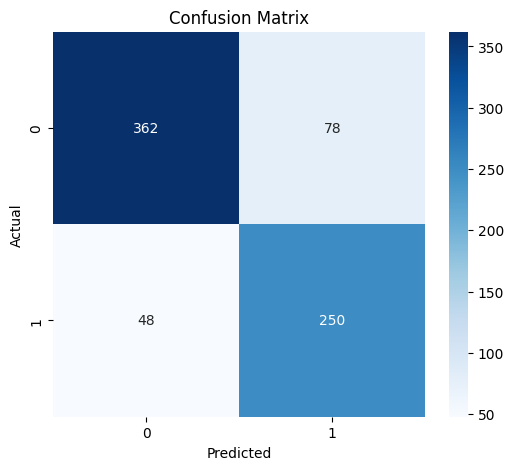

In [245]:
evaluate_cnn_model(cnn_model, test_data)

### Evaluation Summary – CNN Model

#### Confusion Matrix
- True Positives (1 predicted as 1): 250  
- True Negatives (0 predicted as 0): 362  
- False Positives (0 predicted as 1): 78  
- False Negatives (1 predicted as 0): 48  

#### Classification Report
- **Accuracy**: 82.93%  
- **Precision**: 82.26%  
- **Recall**: 83.08%  
- **F1-score**: 82.52%  

#### Class-wise Performance
- **Class 0**: Precision 0.88, Recall 0.82, F1-score 0.85  
- **Class 1**: Precision 0.76, Recall 0.84, F1-score 0.80  

#### Conclusion
The CNN model shows good general performance with fairly balanced precision and recall between both classes. However, it struggles slightly more with Class 1, indicating some room for improvement on detecting that class.


## Xgboost

Accuracy: 0.8482, Precision: 0.8426, Recall: 0.8419, F1-score: 0.8422

Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.88      0.87       440
           1       0.81      0.81      0.81       298

    accuracy                           0.85       738
   macro avg       0.84      0.84      0.84       738
weighted avg       0.85      0.85      0.85       738



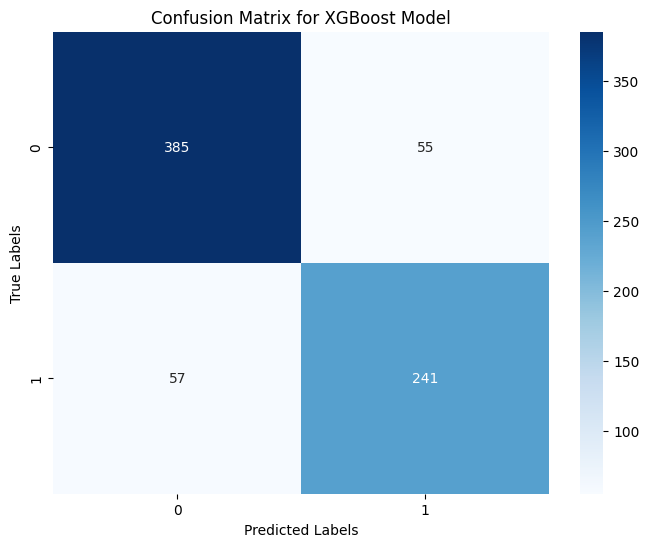

In [246]:
# Création de l'instance du classifieur XGBoost avec les hyperparamètres par défaut
xgboost_classifier = XGBoostClassifier(learning_rate=0.05, n_estimators=200, max_depth=5)

# Entraînement du modèle
xgboost_classifier.train_model(X_train_resampled, y_train_resampled)

# Évaluation du modèle
xgboost_classifier.evaluate_xgboost_model(X_test, y_test)


### Evaluation Summary – XGBoost Model

#### Confusion Matrix
- True Positives (1 predicted as 1): 241  
- True Negatives (0 predicted as 0): 385  
- False Positives (0 predicted as 1): 55  
- False Negatives (1 predicted as 0): 57  

#### Classification Report
- **Accuracy**: 84.82%  
- **Precision**: 84.26%  
- **Recall**: 84.19%  
- **F1-score**: 84.22%  

#### Class-wise Performance
- **Class 0**: Precision 0.87, Recall 0.88, F1-score 0.87  
- **Class 1**: Precision 0.81, Recall 0.81, F1-score 0.81  

#### Conclusion
The XGBoost model achieves strong and consistent performance across both classes, with a well-balanced precision and recall. It provides a robust option when interpretability and performance are both essential.


## Lstm 

In [248]:
from Models.lstm_merged import LSTMClassifier

In [249]:
# Create LSTMClassifier 
lstm_classifier = LSTMClassifier(tokenizer=debtokenizer, embedding_dim=768)

# Train the model with pre-combined embeddings
history = lstm_classifier.train_model(train_data, test_data)



Epoch 1/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - Precision: 0.4602 - Recall: 0.5563 - accuracy: 0.5711 - loss: 0.8309 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.5962 - val_loss: 0.6680 - learning_rate: 1.0000e-04
Epoch 2/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - Precision: 0.6257 - Recall: 0.7579 - accuracy: 0.7320 - loss: 0.5438 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.5962 - val_loss: 0.6508 - learning_rate: 1.0000e-04
Epoch 3/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - Precision: 0.6728 - Recall: 0.7552 - accuracy: 0.7646 - loss: 0.4952 - val_Precision: 0.9487 - val_Recall: 0.1242 - val_accuracy: 0.6436 - val_loss: 0.6190 - learning_rate: 1.0000e-04
Epoch 4/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - Precision: 0.7057 - Recall: 0.7591 - accuracy: 0.7809 - loss: 0.4455 - val_Precision: 0.8696 - val_Recall: 0.2685 - val_accuracy: 0.6883 - val_loss: 0.5644 - learning_rate: 1.0000e-04
Epoch 5/50
83/83 ━━━━━━━━━━━━━━━━━━

24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
Accuracy: 0.9051, Precision: 0.9103, Recall: 0.8928, F1-score: 0.8996

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.96      0.92       440
           1       0.93      0.83      0.88       298

    accuracy                           0.91       738
   macro avg       0.91      0.89      0.90       738
weighted avg       0.91      0.91      0.90       738



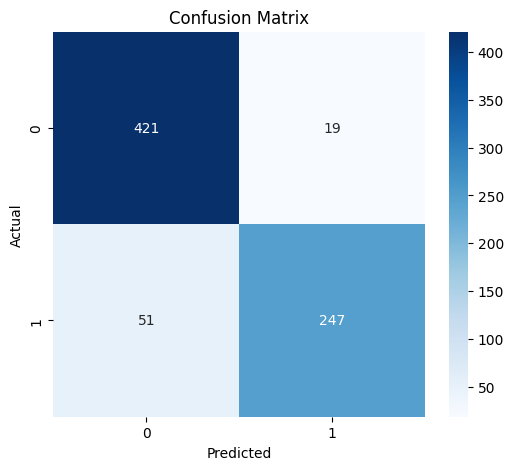

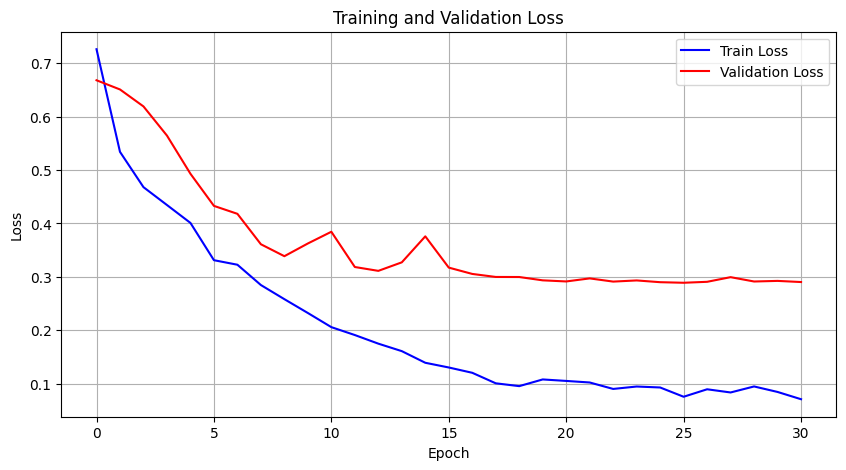

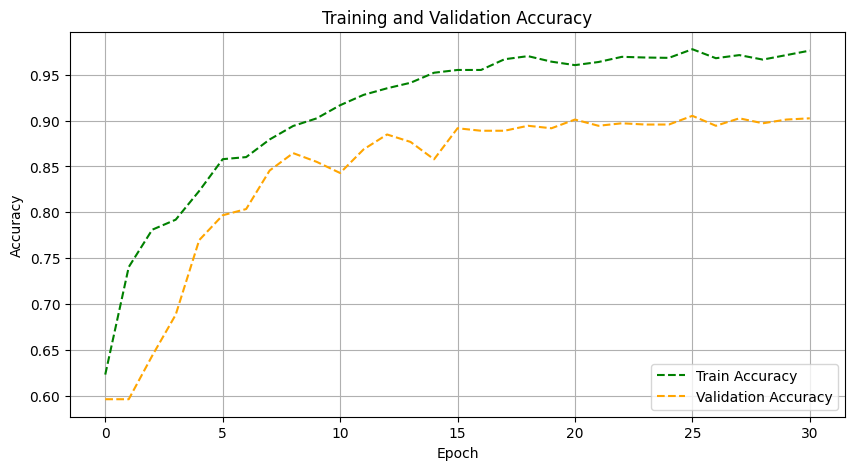

In [250]:
# Evaluate the model
lstm_classifier.evaluate_model(test_data)

# Plot metrics
lstm_classifier.plot_metrics(history)

## Model Evaluation Summary

### Overall Metrics
- **Accuracy**: 90.51%
- **Precision**: 91.03%
- **Recall**: 89.28%
- **F1-Score**: 89.96%

These metrics show that the model performs well overall, with a good balance between correctly identifying positive cases and avoiding false positives.

---

### Classification Report

| Class | Precision | Recall | F1-score | Support |
|-------|-----------|--------|----------|---------|
| 0     | 0.89      | 0.96   | 0.92     | 440     |
| 1     | 0.93      | 0.83   | 0.88     | 298     |

- Class 0 (presumably the majority class) has higher recall, meaning most actual class 0 instances are correctly identified.
- Class 1 has higher precision, suggesting the model is more conservative but accurate when predicting this class.

The macro and weighted averages for F1-score are both around 0.90, which reinforces the model's strong and balanced performance.

---

### Confusion Matrix

|           | Predicted 0 | Predicted 1 |
|-----------|-------------|-------------|
| Actual 0  | 421         | 19          |
| Actual 1  | 51          | 247         |

Most predictions are correct. The main source of error comes from the model misclassifying class 1 instances as class 0, which could indicate room for improvement in recall for class 1.

---

### Training and Validation Loss

- Training loss decreases consistently across epochs, showing that the model is learning effectively.
- Validation loss flattens out after around 15 epochs, which is a good sign that overfitting is under control, though the gap between training and validation loss suggests some variance.

---

### Training and Validation Accuracy

- Training accuracy steadily increases and levels off around 97%.
- Validation accuracy plateaus around 90%, which is solid performance and shows decent generalization.
- There is a small gap between training and validation accuracy, indicating some overfitting, but it's not extreme.

---

### Conclusion

The model performs strongly overall with high accuracy, precision, and F1-scores. It's particularly effective at correctly identifying class 0. While class 1 performance is also good, there’s slightly lower recall, meaning it misses some positive cases.

To further improve the model:
- You might explore class balancing techniques or cost-sensitive learning if class 1 is underrepresented.
- Fine-tuning the classification threshold could help improve recall for class 1 without sacrificing too much precision.
- Regularization or dropout tuning may help reduce the small gap between training and validation performance.


## Hard Voting

In [251]:
# Initialize the HardVotingClassifier with all five models
hard_voting_model = HardVotingClassifier(
    svm_model=svm_model,
    knn_model=knn_classifier,
    lstm_model=lstm_classifier,
    cnn_model=cnn_model,
    xgboost_model=xgboost_classifier
)


val_inputs_tensor = torch.tensor(X_val, dtype=torch.float32)

# Perform predictions using the hard voting model
y_pred = hard_voting_model.predict(X_val, X_val, val_inputs_tensor)

# Evaluate the model performance 
accuracy = accuracy_score(y_val, y_pred)
print(f'Accuracy of Hard Voting Classifier: {accuracy:.4f}')


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Accuracy of Hard Voting Classifier: 0.9322


In [252]:
# List of models
models = ['hard_voting', 'svm', 'knn', 'lstm', 'cnn', 'xgboost']

# Model instances
the_models = {
    'hard_voting': hard_voting_model,
    'svm': svm_model,
    'knn': knn_classifier,
    'lstm': lstm_classifier,
    'cnn': cnn_model,
    'xgboost': xgboost_classifier
}

# Instantiate and evaluate

model_evaluator = ModelEvaluator(models, the_models, X_val, X_val, val_inputs_tensor, y_val)
model_evaluator.evaluate_models()
print('---Accuracy with merged embeddings ---')
accuracy_df_merged = model_evaluator.display_results()


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
---Accuracy with merged embeddings ---
         Model  Accuracy
0  hard_voting  0.932203
1          svm  0.861017
2          knn  0.772881
3         lstm  0.942373
4          cnn  0.891525
5      xgboost  0.901695


## LIME (Local Interpretable Model-agnostic Explanations)

##### We're gonna test LIME using our LSTM model (with GPT embedding : Accuracy 97% )

In [274]:
# You can change the embedding from the train to see the impact of each one
custom_feature_names = [f'emb_dim_{i}' for i in range(traindata['comment_embedding'].iloc[0].shape[0])]  
exp = explain_instance(
    traindata=traindata,
    model=lstm_classifier,
    instance_idx=0,
    num_features=8,
    num_samples=2000,
    feature_names=custom_feature_names,
    class_names=['non-hate', 'hate']
)

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Explanation for the chosen instance:
[('emb_dim_1917 <= 0.02', 0.06402691920939191), ('emb_dim_426 > 0.30', -0.046717471765449846), ('emb_dim_199 <= 0.18', -0.033909346282986606), ('emb_dim_101 <= -0.17', -0.028982551995282137), ('0.09 < emb_dim_1982 <= 0.10', 0.025718162446589157), ('-0.00 < emb_dim_1689 <= 0.02', -0.02449248371758165), ('emb_dim_834 > -0.01', 0.02326093299114333), ('emb_dim_1922 <= 0.03', 0.0078111958565752196)]


### Model Prediction

- **Predicted Label**: Hate
- **Probability**: 
  - Hate: 97%
  - Non-Hate: 3%

The model is highly confident in predicting the input as "hate".

### Feature Contribution (Top Features)

| Feature         | Value   | Influence |
|-----------------|---------|-----------|
| emb_dim_1917    | -0.00   | strong toward hate |
| emb_dim_426     |  0.32   | pushes toward non-hate |
| emb_dim_199     |  0.05   | minor influence toward non-hate |
| emb_dim_101     | -0.43   | pushes toward non-hate |
| emb_dim_1982    |  0.10   | toward hate |
| emb_dim_1689    |  0.01   | neutral |
| emb_dim_834     | -0.01   | slightly toward hate |
| emb_dim_1922    |  0.01   | slightly toward hate |

- Despite a few features nudging toward "non-hate", the overall contribution leans heavily toward the "hate" class.


## SHAP (SHapley Additive exPlanations)

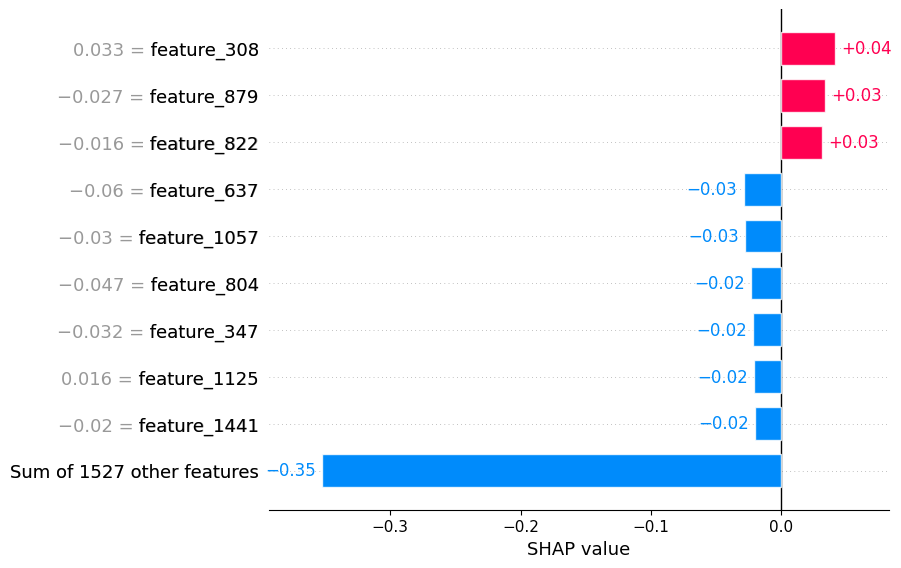

In [25]:
# Example: explain the prediction for the first comment
shap_values, instance = explain_with_shap(model=lstm_classifier, traindata=traindata, index=0)

shap.initjs()
custom_feature_names = [f'emb_dim_{i}' for i in range(instance.shape[1])]
shap.force_plot(shap_values=shap_values[0], features=instance.numpy()[0], feature_names=custom_feature_names)

## Feature Impact Analysis (SHAP Summary)

This SHAP plot breaks down how individual features contributed to the model’s prediction for a single instance. The values represent each feature’s effect on shifting the prediction toward or away from the target class.

###  Features pushing the prediction **away** from the target:
These features decreased the model's confidence in the predicted class.

| Feature         | Value    | SHAP Impact |
|-----------------|----------|-------------|
| feature_637     | -0.06    | -0.03       |
| feature_1057    | -0.03    | -0.03       |
| feature_804     | -0.047   | -0.02       |
| feature_347     | -0.032   | -0.02       |
| feature_1441    | -0.02    | -0.02       |
| Sum of 1527 other features | — | **-0.35** (combined effect)

###  Features pushing the prediction **toward** the target:
These features slightly increased the model’s confidence.

| Feature         | Value    | SHAP Impact |
|-----------------|----------|-------------|
| feature_308     |  0.033   | +0.04       |
| feature_879     | -0.027   | +0.03       |
| feature_822     | -0.016   | +0.03       |
| feature_1125    |  0.016   | +0.02       |

---

### Summary
- The model's prediction was largely pushed in the **negative direction** (away from the target class), mostly driven by the collective influence of over 1500 minor features.
- Only a few features had a positive influence, but their effect was not strong enough to outweigh the cumulative negative push.

This kind of SHAP analysis is especially useful for understanding **why** a model made a certain decision and identifying which features matter most for that specific instance.
